In [ ]:
!python -m spacy download en_core_web_lg # Restart Runtime

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
2023-03-18 08:50:04.057176: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-18 08:50:06.971057: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-03-18 08:50:06.971167: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open share

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import spacy
nlp = spacy.load('en_core_web_lg')

/usr/local/lib/python3.9/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [ ]:
# Installations
import sys
if 'google.colab' in sys.modules:
    !pip install emoji --upgrade
    !pip install pandas-profiling==2.*
    !pip install plotly==4.*
    !python -m spacy download en_core_web_lg
    !pip install pyldavis
    !pip install gensim
    !pip install nltk
    !pip install chart_studio
    !pip install --upgrade autopep8
    !pip install vaderSentiment
    !pip install datatable
    

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 KB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234926 sha256=dae9357db6011ade66e6d23aad03f2549f66d8d6cebe1b362244e052a8d7d64b
  Stored in directory: /root/.cache/pip/wheels/9a/b8/0f/f580817231cbf59f6ade9fd132ff60ada1de9f7dc85521f857
Successfully built emoji
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 245.2/245.2 KB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 KB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.1/353.1 KB 26.4 MB/s eta 0:00:00
  Attempting uninstall: multimethod
    Found existing installation: multimethod 1.9.1
    Uninstalling multimethod-1.9.1:
      Successfully uninstalled mu

In [ ]:
# Required Libraries

#Base and Cleaning 
import json
import requests
import pandas as pd
import numpy as np
import emoji
import regex
import re
import string
import pandas as pd
from collections import Counter
from random import seed

#Visualizations
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt 
import pyLDAvis
import chart_studio
import chart_studio.plotly as py 
import chart_studio.tools as tls
import matplotlib.pyplot as plt
import pyLDAvis.gensim_models as gensimvis

#Natural Language Processing (NLP)
import spacy
import gensim
from spacy.tokenizer import Tokenizer
from gensim.corpora import Dictionary
from gensim.models.ldamulticore import LdaMulticore
from gensim import models
from gensim.models.coherencemodel import CoherenceModel
from gensim.parsing.preprocessing import STOPWORDS as SW
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import GridSearchCV
from pprint import pprint
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)
import nltk 
from nltk.tokenize import word_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer 
nltk.download('stopwords')
from nltk.corpus import stopwords


/usr/local/lib/python3.9/dist-packages/gensim/matutils.py:23: DeprecationWarning: Please use `triu` from the `scipy.linalg` namespace, the `scipy.linalg.special_matrices` namespace is deprecated.
  from scipy.linalg.special_matrices import triu
/usr/local/lib/python3.9/dist-packages/gensim/corpora/dictionary.py:11: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  from collections import Mapping, defaultdict
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Load the data
%cd /content/drive/MyDrive/Colab_Notebooks
df_example = pd.read_csv('TripAdvisor_data_cleaned.csv')


/content/drive/MyDrive/Colab_Notebooks


In [ ]:
# Delete empty data
df_example = df_example[df_example['Review'].notnull()]
df_example['Review']

0         David Thanga Mikail and Chef Steven gave brill...
1         We visited for family celebration and as usual...
2         Perfect dinner after a long journey.After trav...
3         Had a great Tomahawk for me and hubby thanks t...
4         Excellent ambient. Excellent service by David ...
                                ...                        
139759    There's a strange smell from there strongest a...
139760    After reading about their negative comments i ...
139761    Breakfast is good with plenty of varieties. Th...
139762    Buffet dinner. Spacious dining area inside KSL...
139763    Situated conveniently on the 2nd floor of KSL ...
Name: Review, Length: 139764, dtype: object

In [ ]:
# Calculate number of words per review
df_example["Numero de palabras"] = df_example["Review"].apply(lambda n: len(n.split()))
df_example["Review"]

0         David Thanga Mikail and Chef Steven gave brill...
1         We visited for family celebration and as usual...
2         Perfect dinner after a long journey.After trav...
3         Had a great Tomahawk for me and hubby thanks t...
4         Excellent ambient. Excellent service by David ...
                                ...                        
139759    There's a strange smell from there strongest a...
139760    After reading about their negative comments i ...
139761    Breakfast is good with plenty of varieties. Th...
139762    Buffet dinner. Spacious dining area inside KSL...
139763    Situated conveniently on the 2nd floor of KSL ...
Name: Review, Length: 139764, dtype: object

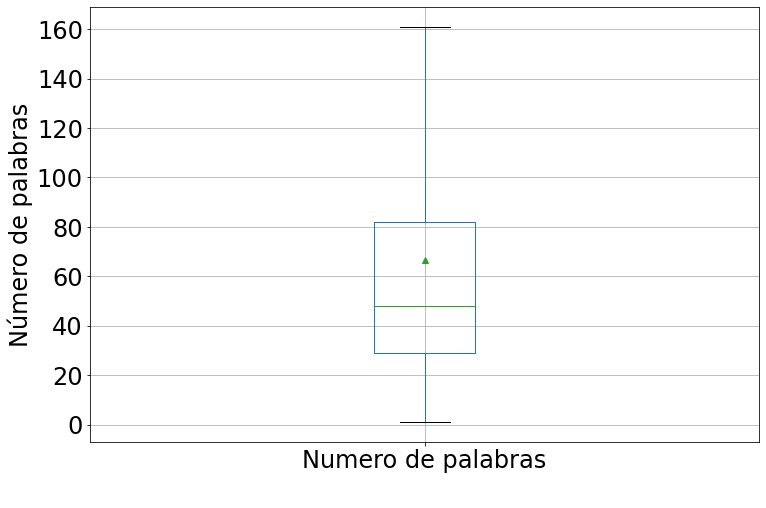

In [ ]:
# Boxplot number of words per review
df_example = pd.read_csv('Restauracion.csv')
ax1 = df_example.boxplot(column="Numero de palabras", figsize=(12,8), showmeans=True, showfliers=False,fontsize=24) #delete outliers
ax1.set_ylabel('Número de palabras', fontsize=24)
ax1.set_xlabel(' ', fontsize=24)
plt.show() 

In [ ]:
# Describe the obtained information
df_example['Numero de palabras'].describe()

count    139764.000000
mean         66.766793
std          61.699200
min           1.000000
25%          29.000000
50%          48.000000
75%          82.000000
max        1375.000000
Name: Numero de palabras, dtype: float64

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('Reviewed','')
df_example['Dates'] = df_example['Dates'].str.replace('5 days ago','15 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('4 days ago','14 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('3 days ago','13 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('6 days ago','16 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('2 days ago','12 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('yesterday','11 April 2022')
df_example['Dates'] = df_example['Dates'].str.replace('today','10 April 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('5 weeks ago','15 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('4 weeks ago','8 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('3 weeks ago','1 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('2 weeks ago','24 April 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_example['Dates'] = df_example['Dates'].str.replace('1 week ago','17 April 2022')

In [ ]:
df_example

,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras
0,kmc1e2018,Chambers Bar and Grill,David Thanga Mikail and Chef Steven gave brill...,5.0,11 April 2022,Chambers Grill,KL,16
1,MizOthmanKuala Lumpur Malaysia,Always a pleasure. Place to celebrate.,We visited for family celebration and as usual...,5.0,15 April 2022,Chambers Grill,KL,47
2,Relax36268533224Hjarno Denmark,Enjoying good service and good food after a lo...,Perfect dinner after a long journey.After trav...,5.0,17 April 2022,Chambers Grill,KL,49
3,tstrry,Great Steak for Couples,Had a great Tomahawk for me and hubby thanks t...,5.0,17 April 2022,Chambers Grill,KL,40
4,Naim_123456789,Dining,Excellent ambient. Excellent service by David ...,5.0,17 April 2022,Chambers Grill,KL,20
...,...,...,...,...,...,...,...,...
139759,Tomz1972,Standard hotel breakfast,There's a strange smell from there strongest a...,3.0,23 March 2013,Infusion,JB,37
139760,mimie_amelliasingapore,Good place!,After reading about their negative comments i ...,4.0,12 February 2013,Infusion,JB,97
139761,Jeff1551,Breakfast,Breakfast is good with plenty of varieties. Th...,4.0,11 January 2013,Infusion,JB,24
139762,Rezzqi,Huge selection,Buffet dinner. Spacious dining area inside KSL...,4.0,16 December 2012,Infusion,JB,35


In [ ]:
# Group the reviews by date
df_group_date=df_example.groupby(["Dates"])["Review"].count().reset_index(name="count")
df_group_date 
# Save the information to csv
df_group_date.to_csv('Restauracion_fechas2.csv')

In [ ]:
# Eliminate empty data
df_example.replace('', np.nan, inplace=True)
df_example.dropna(inplace=True)

In [ ]:
df_example

,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras
0,kmc1e2018,Chambers Bar and Grill,David Thanga Mikail and Chef Steven gave brill...,5.0,11 April 2022,Chambers Grill,KL,16
1,MizOthmanKuala Lumpur Malaysia,Always a pleasure. Place to celebrate.,We visited for family celebration and as usual...,5.0,15 April 2022,Chambers Grill,KL,47
2,Relax36268533224Hjarno Denmark,Enjoying good service and good food after a lo...,Perfect dinner after a long journey.After trav...,5.0,17 April 2022,Chambers Grill,KL,49
3,tstrry,Great Steak for Couples,Had a great Tomahawk for me and hubby thanks t...,5.0,17 April 2022,Chambers Grill,KL,40
4,Naim_123456789,Dining,Excellent ambient. Excellent service by David ...,5.0,17 April 2022,Chambers Grill,KL,20
...,...,...,...,...,...,...,...,...
139759,Tomz1972,Standard hotel breakfast,There's a strange smell from there strongest a...,3.0,23 March 2013,Infusion,JB,37
139760,mimie_amelliasingapore,Good place!,After reading about their negative comments i ...,4.0,12 February 2013,Infusion,JB,97
139761,Jeff1551,Breakfast,Breakfast is good with plenty of varieties. Th...,4.0,11 January 2013,Infusion,JB,24
139762,Rezzqi,Huge selection,Buffet dinner. Spacious dining area inside KSL...,4.0,16 December 2012,Infusion,JB,35


In [ ]:
df_example
# Save df to csv
df_example.to_csv('Restauracion.csv')

In [ ]:
# Define the stopwords
stop_words=stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
# Add more stop words that apply to this dataset
stop_words.extend(['not','amp','bit','like'])

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Lemmatization, elimination of stop words and normalization process
def lemma_words(text):
    lemmas = []
    doc= nlp(text)
    for token in doc: 
        if ((token.is_stop == False) and (token.is_punct == False)) and (token.pos_ != 'PRON'):
            lemmas.append(token.lemma_)
    lemmas= [i for i in lemmas if len(i) > 1]
    lemmas=[word for word in lemmas if word not in stop_words]
    lemmas=' '.join(lemmas)
    lemmas= lemmas.lower()
    return lemmas

df_example['lemmas'] = df_example['Review'].apply(lemma_words)

In [ ]:
# Save to csv
df_example['lemmas'].to_csv('Lemmas_Restauracion.csv')

# Wordcloud

In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(10, 7))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

In [ ]:
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(' '.join(df_example['lemmas']))

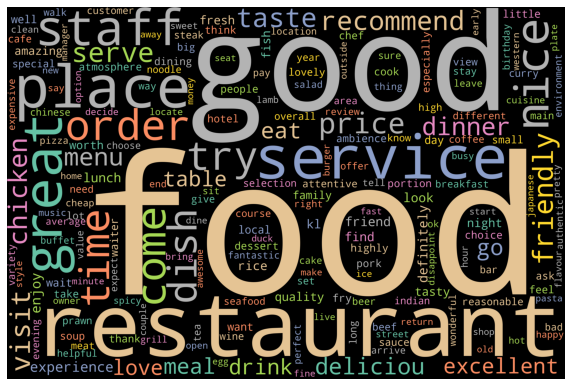

In [ ]:
plot_cloud(wordcloud) 


# Unigramas, Bigramas, Trigramas

In [ ]:
dft= df_example['lemmas']
dft = [x for x in dft if str(x) != 'nan']
print(dft)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
### Function to calculate the TF-IDF of Unigrams
tfIdfVectorizer=TfidfVectorizer(use_idf=True)
tfIdf = tfIdfVectorizer.fit_transform(dft)
names=tfIdfVectorizer.get_feature_names()
freqs = tfIdf.sum(axis=0).A1
result = dict(zip(names, freqs))
print(result)

{'00': 119.89975872300776, '000': 0.8327436335604445, '0030': 0.45418742663532596, '0030hr': 0.38267465259045347, '0041': 0.4309268755901159, '00a': 0.3216573107226555, '00am': 8.863751590187137, '00amits': 0.32253035907237876, '00amthe': 0.32253035907237876, '00and': 0.33519986856048795, '00anybody': 0.21279824727805588, '00aud': 0.1906118040155691, '00c': 0.0811016903322728, '00daily': 0.1508842580390011, '00definitely': 0.1464230874176357, '00dessert': 0.07694283797701407, '00food': 0.11741331907864988, '00he': 0.1468196864445163, '00i': 0.6996519532768048, '00ingredient': 0.16785192422369397, '00ladie': 0.05749698759443568, '00main': 0.07694283797701407, '00net': 0.21036473038950015, '00noonreceipt': 0.13734876781792701, '00now': 0.17842196797581583, '00overall': 0.14514688183283506, '00p': 0.761202200459894, '00pm': 28.174247783501954, '00pmlunch': 0.2696348935442432, '00pmstill': 0.36490984426452683, '00pmthe': 0.27998816952315997, '00rm': 0.363355291109415, '00s': 0.325414149279

In [ ]:
# Obtain the first 30 most relevant words in the TF-IDF
from operator import itemgetter
i = 0
results_sorted=sorted(result.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 31:
      break
    print(key, value)

food 6724.320375986845
good 6433.8137108945575
service 4372.284738642849
great 4197.359891232237
place 4169.159717017059
restaurant 3829.4751971756887
nice 3492.270811743332
staff 3342.555801995859
friendly 2804.4858788479723
come 2759.3060085983925
time 2668.4605362432667
try 2633.985993914047
price 2626.8853785357546
recommend 2500.154354878646
dish 2419.2621139585895
order 2391.1133224323694
visit 2342.356512165425
delicious 2291.289588679954
taste 2146.7609488740836
excellent 2142.36418414394
serve 2138.5466047467125
dinner 2059.068987665032
love 2043.3467939024817
chicken 2032.8615797887805
eat 1928.6817277112889
menu 1881.4277295736965
drink 1859.8113482727942
go 1816.8544702522674
meal 1787.899330340174
enjoy 1781.4377995972425


Text(0.5, 1.0, 'Unigramas más relevantes del corpus')

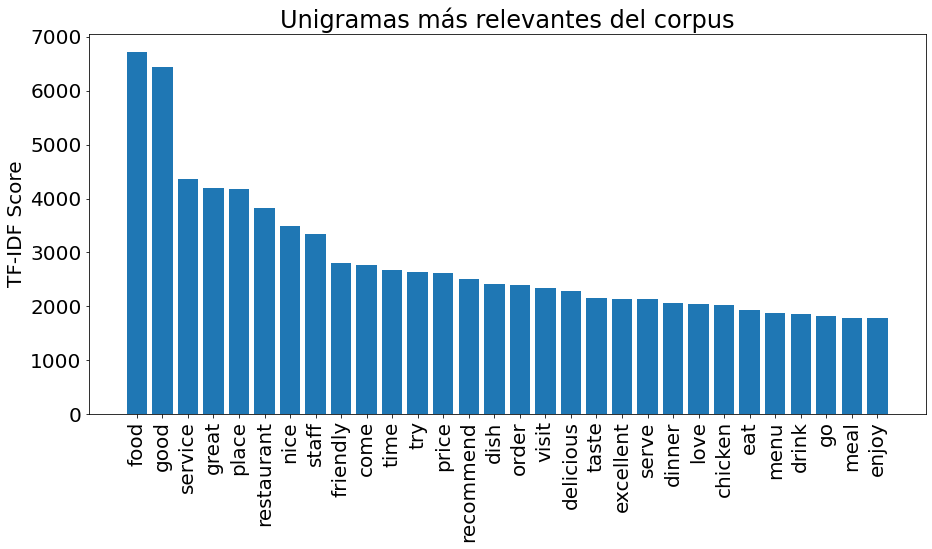

In [ ]:
# Plot the most relevant unigrams
df_results=pd.DataFrame.from_dict(results_sorted).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results[0],df_results[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Unigramas más relevantes del corpus')

In [ ]:
# Obtain the first 30 most relevant bigrams in the TF-IDF
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

In [ ]:
# Obtain the first 30 most relevant words in the TF-IDF
from operator import itemgetter
i = 0
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted_bi:
    i += 1
    if i == 31:
      break
    print(key, value)

food good 801.3910818791476
good food 660.9316181019362
good service 638.3913300910125
highly recommend 594.6968052801145
staff friendly 565.8086836174983
service good 551.7782789519358
food great 473.0121995083989
friendly staff 456.4160775870213
great food 439.53195371242884
great service 408.68774328716097
good place 397.9829953139875
food delicious 378.7362321301361
food service 370.67480887323353
excellent service 340.2811250758653
food nice 322.993072092539
great place 321.8170311503391
definitely come 319.5271653006661
price reasonable 318.83515725936803
nice place 310.9116899473312
dim sum 300.68717577561205
reasonable price 296.32086556275544
food excellent 280.1379780067618
service great 279.1954488903967
quality food 275.09344162382433
kuala lumpur 267.2505591168458
food serve 263.87277499264763
service excellent 263.2700527104363
delicious food 260.3649422640195
nice food 259.5659425870389
value money 258.6041990771251


Text(0.5, 1.0, 'Bigramas más relevantes del corpus')

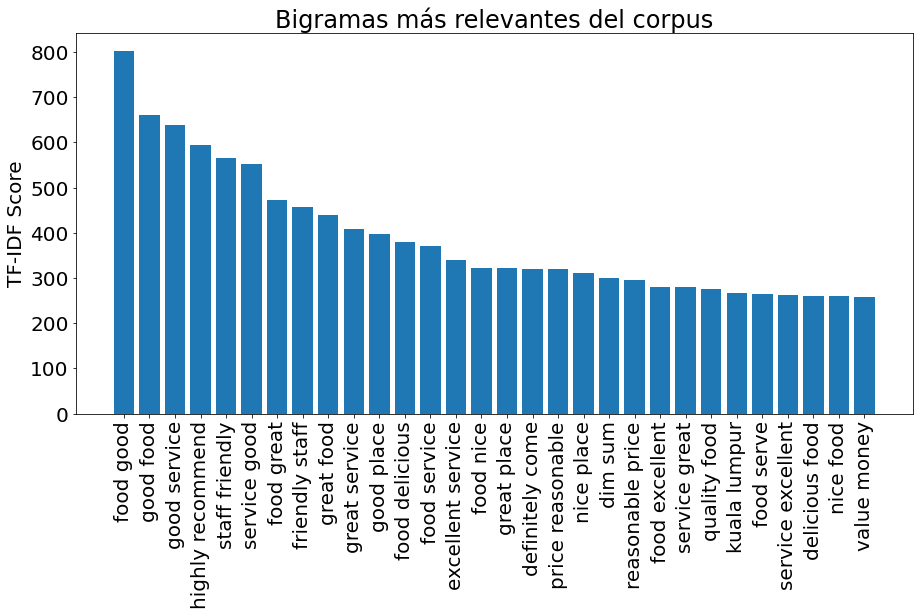

In [ ]:
# Plot the most relevant bigrams
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del corpus')

In [ ]:
# Obtain the first 30 most relevant trigrams in the TF-IDF
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

In [ ]:
# Obtain the first 30 most relevant words in the TF-IDF
from operator import itemgetter
i = 0
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted_tri:
    i += 1
    if i == 31:
      break
    print(key, value)

food good service 143.2736986122751
food great service 110.54686883170211
good food good 99.21007699120929
staff friendly helpful 91.67975698985471
service good food 91.27627249953798
good service good 84.30983572616968
great food great 79.43129530849149
food reasonable price 78.37269151233212
food excellent service 75.85021906927861
good value money 74.64718535995394
highly recommend place 60.860237413425736
food good price 56.1231000320925
food taste good 54.76244531063758
food friendly staff 52.898629149950715
good staff friendly 52.08319866942595
staff friendly attentive 51.75492617822679
definitely worth visit 50.37230372082102
friendly staff good 50.13546841111165
food service good 49.907276269928175
service great food 48.459091448497354
chicken rice ball 47.68752073524868
hard rock cafe 47.08035247246421
staff friendly food 46.140552312388145
soft shell crab 45.94188416176959
service friendly staff 45.02403682137814
highly recommend restaurant 43.30017658885223
bak kut teh 43.06

Text(0.5, 1.0, 'Trigramas más relevantes del corpus')

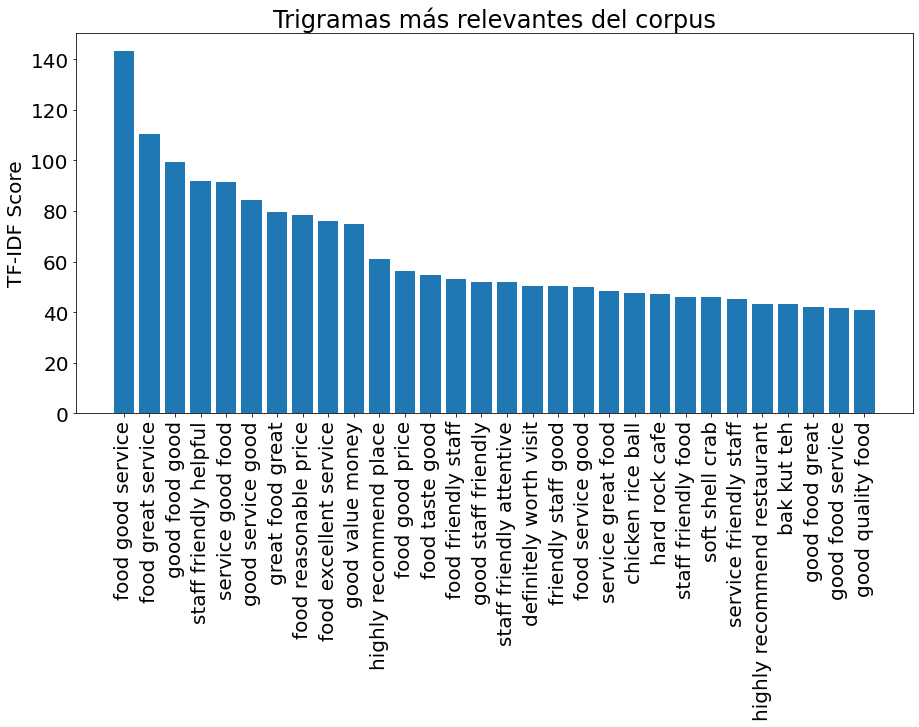

In [ ]:
# Plot the most relevant trigrams
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del corpus')

# Modelado de tópicos

In [ ]:
# Load the data
df_model = pd.read_csv('Lemmas_Restauracion.csv')
print(df_model.head())

   Unnamed: 0                                             lemmas
0           0  david thanga mikail chef steven give brilliant...
1           1  visit family celebration usual restaurant disa...
2           2  perfect dinner long journey travel dk kuala lu...
3           3  great tomahawk hubby thank david azzu great ch...
4           4  excellent ambient excellent service david than...


In [ ]:
# Tokenize the data
def tokenize(text):
    text = str(text)
    tokens = text.split() # Make text lowercase and split it
    return tokens

# Apply tokenizer
df_model['tokens'] = df_model['lemmas'].apply(tokenize)
#df_model['tokens'] = df_example['lemmas'].apply(tokenize)
print(df_model.head())

   Unnamed: 0                                             lemmas  \
0           0  david thanga mikail chef steven give brilliant...   
1           1  visit family celebration usual restaurant disa...   
2           2  perfect dinner long journey travel dk kuala lu...   
3           3  great tomahawk hubby thank david azzu great ch...   
4           4  excellent ambient excellent service david than...   

                                              tokens  
0  [david, thanga, mikail, chef, steven, give, br...  
1  [visit, family, celebration, usual, restaurant...  
2  [perfect, dinner, long, journey, travel, dk, k...  
3  [great, tomahawk, hubby, thank, david, azzu, g...  
4  [excellent, ambient, excellent, service, david...  


In [ ]:
#Importing seed for reproducibility
seed(24)
# Create a dictionary of words for topic modeling
id2word = Dictionary(df_model['tokens'])

In [ ]:
# Filtering Extremes
id2word.filter_extremes(no_below=2, no_above=.95)#100000

In [ ]:
# Creating a corpus object 
corpus = [id2word.doc2bow(d) for d in df_model['tokens']]

In [ ]:
# Finding optimal k (Numer of topics)
# PLEASE TAKE INTO COSNDIERATION THAT THIS MDOEL TAKES A LONG TIME 
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=2):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics
    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the 
    LDA model with respective number of topics
    """
    coherence_values_topic = []
    model_list_topic = []
    for num_topics in range(start, limit, step):
        model = LdaMulticore(corpus=corpus, num_topics=num_topics, id2word=id2word, passes=5)
        model_list_topic.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values_topic.append(coherencemodel.get_coherence())

    return model_list_topic, coherence_values_topic

In [ ]:
# This is to apply the above function which may take a long time 
model_list_topic, coherence_values_topic = compute_coherence_values(dictionary=id2word,
                                                        corpus=corpus,
                                                        texts=df_model['tokens'],
                                                        start=2, limit=16, step=1) #Compute from 2 to 15 yopics to find the optimum

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += 

In [ ]:
# Obtain the values of the coherence score
coherence_values_topic_df = pd.DataFrame(coherence_values_topic) 
# Save the data as csv
coherence_values_topic_df.to_csv('Res_coherence_values_2.csv', index=False)

#coherence_values_topic_df= pd.read_csv('coherence_values.csv', index_col=False) #In case we want to load pre-calculated data
coherence_values_topic_df

,0
0,0.396111
1,0.448104
2,0.461324
3,0.450183
4,0.462970
5,0.460024
6,0.470399
7,0.446304
8,0.449932
9,0.468749


In [ ]:
coherence_values_topic_df=coherence_values_topic_df.iloc[:, 0].tolist()

In [ ]:
coherence_values_topic_df= pd.read_csv('Res_coherence_values_2.csv', index_col=False)
coherence_values_topic_df

,0
0,0.396111
1,0.448104
2,0.461324
3,0.450183
4,0.462970
5,0.460024
6,0.470399
7,0.446304
8,0.449932
9,0.468749


Text(0, 0.5, 'Índice de coherencia')

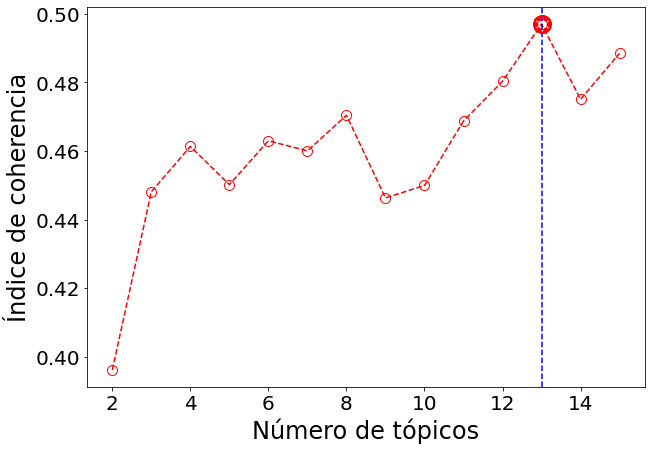

In [ ]:
# PLot to compare the values of the coherence score for each topic
import matplotlib.path as mpath
coherence_values_topic_df= pd.read_csv('Res_coherence_values_2.csv', index_col=False)
plt.figure(figsize=(10,7))
estrella = mpath.Path.unit_regular_star(6)
circulo = mpath.Path.unit_circle()
verts = np.concatenate([circulo.vertices, estrella.vertices[::-1, ...]])
codes = np.concatenate([circulo.codes, estrella.codes])
cut_star = mpath.Path(verts, codes)
plt.plot([2,3,4,5,6,7,8,9,10,11,12,13,14,15],coherence_values_topic_df, '--r', marker="o", markersize=10, fillstyle='none')
plt.axvline(x=13, color='b', linestyle='--')
plt.plot(13, 0.4970 , '--r', marker=cut_star, markersize=18)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Número de tópicos', fontsize=24)
plt.ylabel('Índice de coherencia', fontsize=24)

In [ ]:
# Compute model for k=4
k=4
# LDA model 
model_k4 = gensim.models.LdaMulticore(corpus=corpus, 
                                        id2word=id2word, 
                                        workers=3,
                                        num_topics=k,
                                        passes=5,
                                        random_state= 12)


Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += 

In [ ]:
# Compute Coherence Score 
coherence_model_k4 = CoherenceModel(model=model_k4, texts=df_model['tokens'], 
                                   dictionary=id2word, coherence='c_v')
coherence_model_k4 = coherence_model_k4.get_coherence()
print('\nCoherence Score: ', coherence_model_k4)


Coherence Score:  0.41073818638860216


In [ ]:
# Print the Keyword in the 10 topics
print(model_k4.print_topics())
doc_lda = model_k4[corpus]
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in model_k4.print_topics()]
# Create Topics
topics = [' '.join(t[0:10]) for t in words]
# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

[(0, '0.017*"food" + 0.016*"good" + 0.016*"chicken" + 0.014*"order" + 0.012*"dish" + 0.011*"try" + 0.011*"restaurant" + 0.010*"taste" + 0.009*"rice" + 0.008*"place"'), (1, '0.014*"restaurant" + 0.010*"order" + 0.009*"food" + 0.008*"table" + 0.008*"come" + 0.007*"menu" + 0.007*"experience" + 0.007*"time" + 0.007*"dish" + 0.007*"service"'), (2, '0.068*"food" + 0.051*"good" + 0.035*"service" + 0.026*"great" + 0.023*"staff" + 0.021*"friendly" + 0.020*"place" + 0.019*"nice" + 0.017*"restaurant" + 0.016*"recommend"'), (3, '0.026*"food" + 0.025*"place" + 0.024*"good" + 0.017*"great" + 0.012*"drink" + 0.012*"nice" + 0.010*"restaurant" + 0.009*"cafe" + 0.008*"price" + 0.008*"staff"')]
------ Topic 0 ------
food good chicken order dish try restaurant taste rice place

------ Topic 1 ------
restaurant order food table come menu experience time dish service

------ Topic 2 ------
food good service great staff friendly place nice restaurant recommend

------ Topic 3 ------
food place good great dri

In [ ]:
# Plot intertopic distance map
pyLDAvis.enable_notebook()
gensimvis.prepare(model_k4, corpus, id2word)

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.134091  0.036185       1        1  31.000535
1     -0.097350 -0.080527       2        1  26.745039
2      0.152975 -0.086791       3        1  21.458314
3      0.078467  0.131133       4        1  20.796112, topic_info=         Term           Freq          Total Category  logprob  loglift
4        food  119752.000000  119752.000000  Default  30.0000  30.0000
37       good   97708.000000   97708.000000  Default  29.0000  29.0000
55      great   42160.000000   42160.000000  Default  28.0000  28.0000
8     service   51792.000000   51792.000000  Default  27.0000  27.0000
282   chicken   21422.000000   21422.000000  Default  26.0000  26.0000
..        ...            ...            ...      ...      ...      ...
89   friendly    5688.335825   25713.311052   Topic4  -5.0661   0.0618
8     service    6352.064342   51792.506555   Topic4  -4.9557  -0.5281
309      menu    5048.102056   20494.805792   Topic4  -5.1855   0.1692
83       look    4605.851289   13415.890384   Topic4  -5.2772   0.5013
30       time    5044.459534   30617.421096   Topic4  -5.1862  -0.2329

[365 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
1787       1  0.001570    aglio
1787       2  0.997207    aglio
75         1  0.008677  amazing
75         2  0.166542  amazing
75         3  0.644842  amazing
...      ...       ...      ...
247        2  0.687511     wine
247        3  0.057303     wine
247        4  0.252929     wine
2151       1  0.998757      yam
18725      3  0.996613     yeoh

[772 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4])

In [ ]:
# Compute model for k=13
k=13
# LDA model 
model_k13 = gensim.models.LdaMulticore(corpus=corpus, 
                                        id2word=id2word, 
                                        workers=3,
                                        num_topics=k,
                                        passes=5,
                                        random_state= 12)

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += 

In [ ]:
# Compute Coherence Score 
coherence_model_k13 = CoherenceModel(model=model_k13, texts=df_model['tokens'], 
                                   dictionary=id2word, coherence='c_v')
coherence_model_k13 = coherence_model_k13.get_coherence()
print('\nCoherence Score: ', coherence_model_k13)


Coherence Score:  0.47987071779996093


In [ ]:
# Save model 
model_k13.save("model13_Res_topics.model")

/usr/local/lib/python3.8/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.8/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)
/usr/local/lib/python3.8/dist-packages/smart_open/smart_open_lib.py:496: DeprecationWarning: This function is deprecated.  See https://github.com/RaRe-Technologies/smart_open/blob/develop/MIGRATING_FROM_OLDER_VERSIONS.rst for more information
  warnings.warn(message, category=DeprecationWarning)


In [ ]:
# Print the Keyword in the 10 topics
print(model_k13.print_topics())
doc_lda = model_k13[corpus]
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in model_k13.print_topics()]
# Create Topics
topics = [' '.join(t[0:10]) for t in words]
# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

[(0, '0.031*"chicken" + 0.020*"rice" + 0.019*"good" + 0.016*"try" + 0.015*"food" + 0.015*"curry" + 0.014*"dish" + 0.013*"order" + 0.013*"fish" + 0.012*"taste"'), (1, '0.025*"pizza" + 0.019*"pasta" + 0.016*"good" + 0.016*"dessert" + 0.014*"cream" + 0.013*"ice" + 0.012*"try" + 0.012*"lamb" + 0.011*"cake" + 0.011*"salad"'), (2, '0.088*"food" + 0.074*"good" + 0.043*"service" + 0.035*"nice" + 0.032*"staff" + 0.031*"friendly" + 0.024*"place" + 0.022*"great" + 0.021*"price" + 0.018*"recommend"'), (3, '0.038*"place" + 0.037*"good" + 0.033*"great" + 0.029*"drink" + 0.025*"nice" + 0.022*"food" + 0.019*"beer" + 0.015*"music" + 0.014*"cafe" + 0.014*"bar"'), (4, '0.023*"staff" + 0.019*"table" + 0.017*"restaurant" + 0.015*"wine" + 0.009*"dinner" + 0.008*"menu" + 0.007*"food" + 0.007*"night" + 0.007*"book" + 0.006*"dish"'), (5, '0.024*"food" + 0.023*"order" + 0.014*"time" + 0.014*"table" + 0.014*"come" + 0.013*"wait" + 0.012*"restaurant" + 0.011*"service" + 0.009*"serve" + 0.009*"ask"'), (6, '0.042*"

In [ ]:
# Plot intertopic distance map
pyLDAvis.enable_notebook()
gensimvis.prepare(model_k13, corpus, id2word)

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5      0.024006 -0.036227       1        1  14.914054
7     -0.081327  0.103786       2        1   9.948843
2     -0.140830  0.099657       3        1   9.929220
0      0.170758  0.114037       4        1   9.807197
11     0.235707  0.018378       5        1   7.938933
3     -0.141919  0.133806       6        1   7.100413
6     -0.200007 -0.094736       7        1   6.984547
8     -0.007204  0.155139       8        1   6.427909
4     -0.074226 -0.172492       9        1   6.310524
1      0.113986 -0.063863      10        1   5.713443
12     0.075320 -0.206698      11        1   5.273953
9      0.177644  0.009193      12        1   4.972886
10    -0.151909 -0.059979      13        1   4.678078, topic_info=           Term           Freq          Total Category  logprob  loglift
4          food  118465.000000  118465.000000  Default  30.0000  30.0000
55        great   42107.000000   42107.000000  Default  29.0000  29.0000
37         good   94455.000000   94455.000000  Default  28.0000  28.0000
282     chicken   22036.000000   22036.000000  Default  27.0000  27.0000
28        staff   36831.000000   36831.000000  Default  26.0000  26.0000
...         ...            ...            ...      ...      ...      ...
193          go    1458.091720   19252.534728  Topic13  -4.9355   0.4818
26        serve    1499.519878   25087.582070  Topic13  -4.9075   0.2451
3     excellent    1360.208923   15827.350033  Topic13  -5.0050   0.6082
45        place    1377.450753   53817.721170  Topic13  -4.9924  -0.6031
2660       cafe    1193.999915    8792.843745  Topic13  -5.1353   1.0657

[1059 rows x 6 columns], token_table=       Topic      Freq Term
term                       
1372       1  0.623610   10
1372       2  0.019991   10
1372       3  0.003332   10
1372       4  0.136328   10
1372       5  0.018325   10
...      ...       ...  ...
16143     13  0.995761  yue
3085       2  0.007690  yum
3085       4  0.080744  yum
3085       5  0.904849  yum
3085       7  0.005127  yum

[3887 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 8, 3, 1, 12, 4, 7, 9, 5, 2, 13, 10, 11])

In [ ]:
# Compute model for k=8
k=8
# LDA model 
model_k8 = gensim.models.LdaMulticore(corpus=corpus, 
                                        id2word=id2word, 
                                        workers=3,
                                        num_topics=k,
                                        passes=5,
                                        random_state= 12)

Se han truncado las últimas 5000 líneas del flujo de salida.
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += np.sum(cnt * logsumexp(Elogthetad + Elogbeta[:, int(id)]) for id, cnt in doc)
/usr/local/lib/python3.8/dist-packages/gensim/models/ldamodel.py:1077: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  score += 

In [ ]:
# Compute Coherence Score 
coherence_model_k8 = CoherenceModel(model=model_k8, texts=df_model['tokens'], 
                                   dictionary=id2word, coherence='c_v')
coherence_model_k8 = coherence_model_k8.get_coherence()
print('\nCoherence Score: ', coherence_model_k8)


Coherence Score:  0.47192469280039917


In [ ]:
# Print the Keyword in the 10 topics
print(model_k8.print_topics())
doc_lda = model_k8[corpus]
# Filtering for words 
words = [re.findall(r'"([^"]*)"',t[1]) for t in model_k8.print_topics()]
# Create Topics
topics = [' '.join(t[0:10]) for t in words]
# Getting the topics
for id, t in enumerate(topics): 
    print(f"------ Topic {id} ------")
    print(t, end="\n\n")

[(0, '0.024*"chicken" + 0.017*"rice" + 0.016*"good" + 0.016*"dish" + 0.013*"order" + 0.013*"try" + 0.013*"fish" + 0.012*"taste" + 0.012*"fry" + 0.010*"food"'), (1, '0.015*"good" + 0.012*"order" + 0.012*"pizza" + 0.011*"steak" + 0.011*"try" + 0.010*"lamb" + 0.010*"pasta" + 0.009*"salad" + 0.009*"taste" + 0.008*"chicken"'), (2, '0.076*"food" + 0.065*"good" + 0.038*"service" + 0.030*"nice" + 0.027*"staff" + 0.026*"friendly" + 0.025*"place" + 0.023*"great" + 0.017*"price" + 0.016*"recommend"'), (3, '0.029*"place" + 0.027*"good" + 0.021*"great" + 0.019*"drink" + 0.018*"nice" + 0.016*"cafe" + 0.016*"food" + 0.014*"beer" + 0.010*"bar" + 0.010*"music"'), (4, '0.017*"dinner" + 0.014*"restaurant" + 0.013*"experience" + 0.012*"menu" + 0.012*"birthday" + 0.012*"staff" + 0.012*"dish" + 0.011*"wine" + 0.011*"meal" + 0.011*"dining"'), (5, '0.022*"food" + 0.018*"order" + 0.013*"restaurant" + 0.013*"table" + 0.012*"time" + 0.011*"come" + 0.010*"wait" + 0.010*"service" + 0.008*"serve" + 0.008*"place"'),

In [ ]:
# Plot intertopic distance map
pyLDAvis.enable_notebook()
gensimvis.prepare(model_k8, corpus, id2word)

/usr/local/lib/python3.8/dist-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.034657 -0.017788       1        1  19.560470
0     -0.224655  0.055212       2        1  16.310970
2      0.092836  0.079028       3        1  13.057892
7      0.036606  0.113309       4        1  12.649969
1     -0.208027 -0.111251       5        1  11.061470
3      0.068278  0.160216       6        1  10.557058
4      0.065058 -0.166569       7        1   9.576506
6      0.204561 -0.112156       8        1   7.225665, topic_info=           Term           Freq          Total Category  logprob  loglift
4          food  118274.000000  118274.000000  Default  30.0000  30.0000
37         good   94300.000000   94300.000000  Default  29.0000  29.0000
55        great   41119.000000   41119.000000  Default  28.0000  28.0000
282     chicken   21393.000000   21393.000000  Default  27.0000  27.0000
8       service   50567.000000   50567.000000  Default  26.0000  26.0000
..          ...            ...            ...      ...      ...      ...
68         come    2628.770052   31290.812103   Topic8  -4.7809   0.1507
86   definitely    2073.279092   13541.373276   Topic8  -5.0183   0.7509
37         good    3153.160251   94300.703832   Topic8  -4.5990  -0.7706
45        place    2637.570763   53250.536862   Topic8  -4.7775  -0.3776
187       enjoy    2096.729027   15393.094358   Topic8  -5.0070   0.6340

[678 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
1372       1  0.643086    10
1372       2  0.187915    10
1372       3  0.003341    10
1372       4  0.041202    10
1372       5  0.004454    10
...      ...       ...   ...
261        5  0.034446  year
261        6  0.006554  year
261        7  0.105778  year
261        8  0.116600  year
18725      8  0.996776  yeoh

[2116 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 1, 3, 8, 2, 4, 5, 7])

In [ ]:
model_k8.print_topics()

[(0,
  '0.056*"global" + 0.042*"warming" + 0.021*"year" + 0.016*"weather" + 0.014*"warm" + 0.012*"rise" + 0.010*"ice" + 0.010*"level" + 0.010*"sea" + 0.009*"cold"'),
 (1,
  '0.018*"new" + 0.016*"news" + 0.011*"report" + 0.011*"read" + 0.009*"today" + 0.009*"story" + 0.009*"rt" + 0.009*"thank" + 0.008*"world" + 0.008*"great"'),
 (2,
  '0.015*"fuel" + 0.012*"tax" + 0.012*"water" + 0.011*"fossil" + 0.011*"money" + 0.010*"oil" + 0.009*"air" + 0.009*"coal" + 0.008*"cost" + 0.008*"pollution"'),
 (3,
  '0.014*"energy" + 0.012*"emission" + 0.011*"impact" + 0.011*"help" + 0.011*"carbon" + 0.010*"new" + 0.009*"need" + 0.008*"work" + 0.007*"reduce" + 0.007*"solution"'),
 (4,
  '0.014*"vote" + 0.010*"people" + 0.009*"action" + 0.009*"party" + 0.009*"time" + 0.008*"government" + 0.008*"want" + 0.007*"house" + 0.006*"need" + 0.006*"state"'),
 (5,
  '0.024*"issue" + 0.010*"threat" + 0.009*"policy" + 0.009*"trump" + 0.008*"national" + 0.008*"environmental" + 0.007*"address" + 0.007*"health" + 0.007*"r

In [ ]:
# Obtain the relevance of each topic in the corpus for k=13
def document_to_lda_features(model_k13,document):
  topic_importance=np.array(model_k13.get_document_topics(document, minimum_probability=0))
  return topic_importance[:,1]

df_model['lda_features']=list(map(lambda doc: document_to_lda_features(model_k13,doc), corpus))

In [ ]:
# Tokenize the data
def topic_important(item_score):
    score=np.argmax(item_score, axis=0)
    return score

# See which topic is predominant in each review
df_model['topic_dominant'] = df_model['lda_features'].apply(topic_important)
df_model

,Unnamed: 0,lemmas,tokens,lda_features,topic_dominant
0,0,david thanga mikail chef steven give brilliant...,"[david, thanga, mikail, chef, steven, give, br...","[0.006410269998013973, 0.006410286761820316, 0...",10
1,1,visit family celebration usual restaurant disa...,"[visit, family, celebration, usual, restaurant...","[0.0028490377590060234, 0.05481937527656555, 0...",10
2,2,perfect dinner long journey travel dk kuala lu...,"[perfect, dinner, long, journey, travel, dk, k...","[0.002958607627078891, 0.0029586078599095345, ...",10
3,3,great tomahawk hubby thank david azzu great ch...,"[great, tomahawk, hubby, thank, david, azzu, g...","[0.003663020906969905, 0.0036630257964134216, ...",10
4,4,excellent ambient excellent service david than...,"[excellent, ambient, excellent, service, david...","[0.0059171742759644985, 0.00591718964278698, 0...",10
...,...,...,...,...,...
139759,139759,strange smell strong tower lift lobby food sta...,"[strange, smell, strong, tower, lift, lobby, f...","[0.003663071896880865, 0.0036630297545343637, ...",5
139760,139760,read negative comment personally think massive...,"[read, negative, comment, personally, think, m...","[0.0018315173219889402, 0.0018315138295292854,...",5
139761,139761,breakfast good plenty variety staff helpful fr...,"[breakfast, good, plenty, variety, staff, help...","[0.35993072390556335, 0.005494530778378248, 0....",2
139762,139762,buffet dinner spacious dining area inside ksl ...,"[buffet, dinner, spacious, dining, area, insid...","[0.31171461939811707, 0.10651804506778717, 0.0...",8


In [ ]:
# Save data to csv
df_model.to_csv('topic_model_results_res.csv', index=False)

In [ ]:
# Count the number of reviews associated with each topic
df_model["topic_dominant"].value_counts()

2     25221
5     17148
7     16991
0     14924
6     12715
3     12360
11     8778
8      6821
1      6126
10     5180
4      4882
9      4780
12     3838
Name: topic_dominant, dtype: int64

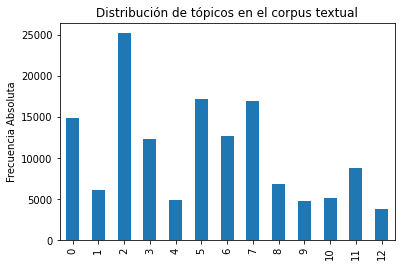

In [ ]:
# Plot topic distribution in the corpus
ax=df_model["topic_dominant"].value_counts().sort_index().plot(kind='bar')
plt.ylabel('Frecuencia Absoluta')
plt.title('Distribución de tópicos en el corpus textual')
plt.show()

In [ ]:
# Procedure to obtain the correct order for the topics (starting in 1 instead of 0)
ax=df_model["topic_dominant"].value_counts().sort_index()
ax = pd.DataFrame(ax)
ax.insert(1, 'Topico', [1,2,3,4,5,6,7,8,9,10,11,12,13], True)
ax


,topic_dominant,Topico
0,14924,1
1,6126,2
2,25221,3
3,12360,4
4,4882,5
5,17148,6
6,12715,7
7,16991,8
8,6821,9
9,4780,10


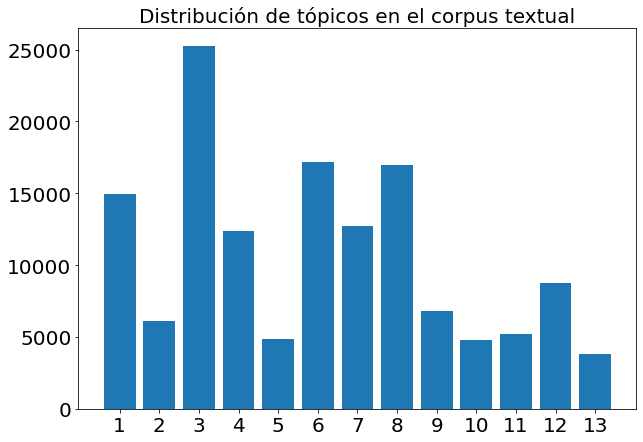

In [ ]:
# Plot topic importance
x_axis = ax['Topico']
y_axis = ax['topic_dominant']
plt.figure(figsize=(10,7))
plt.bar(x_axis, y_axis)
plt.xticks(x_axis, x_axis, fontsize=20)
plt.yticks(fontsize=20)
plt.title('Distribución de tópicos en el corpus textual', fontsize=20)
plt.show()

# Bigramas por tópico

In [ ]:
## Obtain bigrams for each topic
topic_1 = df_model[df_model['topic_dominant']==0] 
dft=topic_1['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi_1= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi_1.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


chicken rice 101.48701457819844
nasi lemak 95.21268222647821
rice ball 61.14490421217456
fry rice 57.87445566916169
food good 56.17488621052991
banana leaf 54.61268299579466
indian food 51.438517609152846
highly recommend 50.426274245734604
taste good 47.10183675296995
price reasonable 43.069012709722294


Text(0.5, 1.0, 'Bigramas más relevantes en el tópico 1')

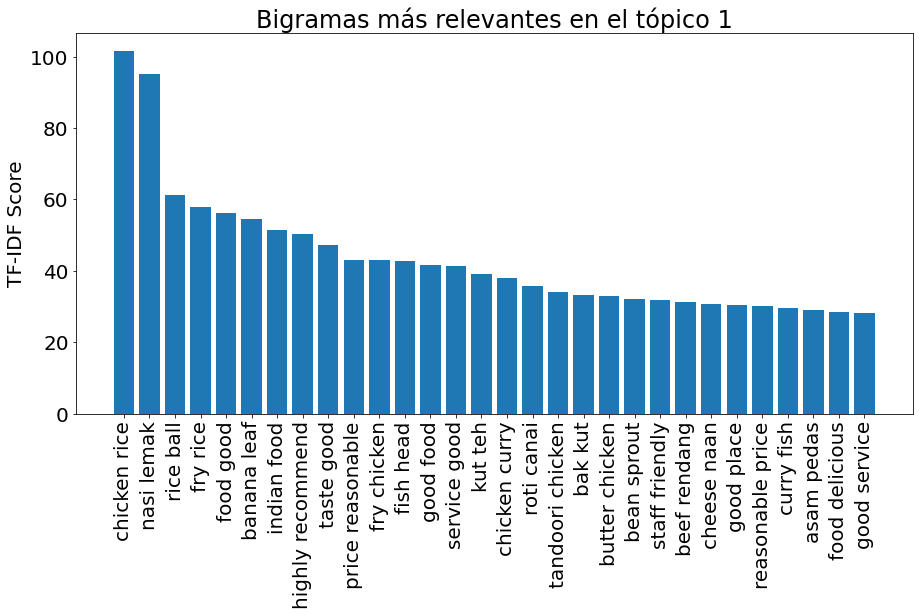

In [ ]:
results_sorted_bi_1=sorted(result_bi_1.items(), key = itemgetter(1), reverse = True)
df_results_bi_1=pd.DataFrame.from_dict(results_sorted_bi_1).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi_1[0],df_results_bi_1[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes en el tópico 1')

In [ ]:
topic_2 = df_model[df_model['topic_dominant']==1] 
dft=topic_2['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(topic_2['lemmas'].values.astype('U'))
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi_2= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi_2.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

ice cream 50.972423168996954
main course 32.07049446001478
highly recommend 27.79184785679353
mushroom soup 23.437688944546863
italian food 21.15056375648877
aglio olio 20.898584483424397
italian restaurant 20.293745612079388
food good 20.18038853556171
service good 19.629363489494153
lamb shank 18.97648618724491


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 2')

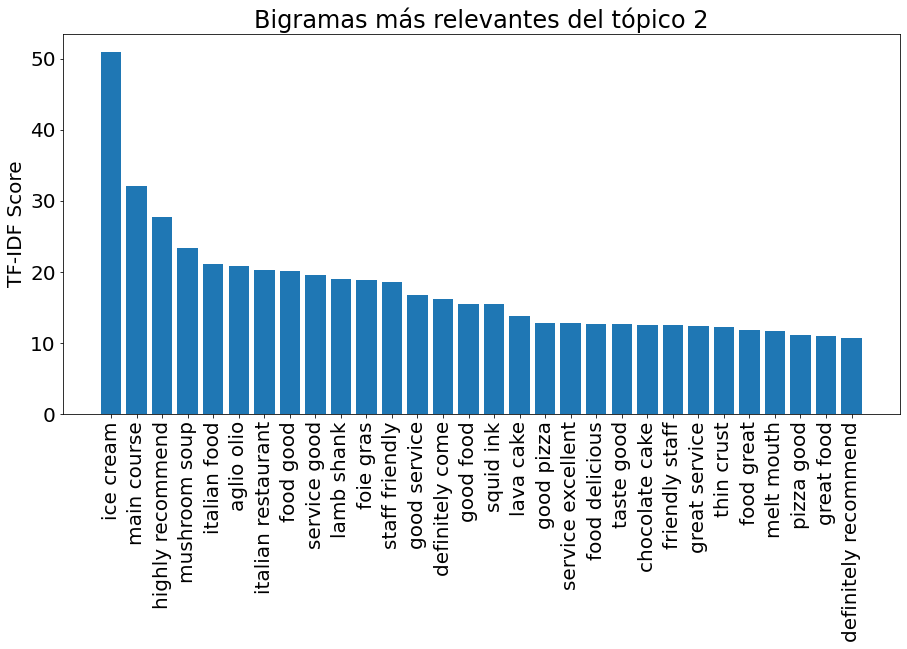

In [ ]:
results_sorted_bi_2=sorted(result_bi_2.items(), key = itemgetter(1), reverse = True)
df_results_bi_2=pd.DataFrame.from_dict(results_sorted_bi_2).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi_2[0],df_results_bi_2[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 2')

In [ ]:
topic_3 = df_model[df_model['topic_dominant']==2] 
dft=topic_3['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good 299.1947747962072
good service 292.22936568063227
good food 266.42044887659836
staff friendly 235.61068713429609
service good 221.46714682981022
friendly staff 204.71036879188347
highly recommend 197.56667580272625
food nice 165.75914710203918
food great 153.38577192319917
food delicious 151.91195086080202


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 3')

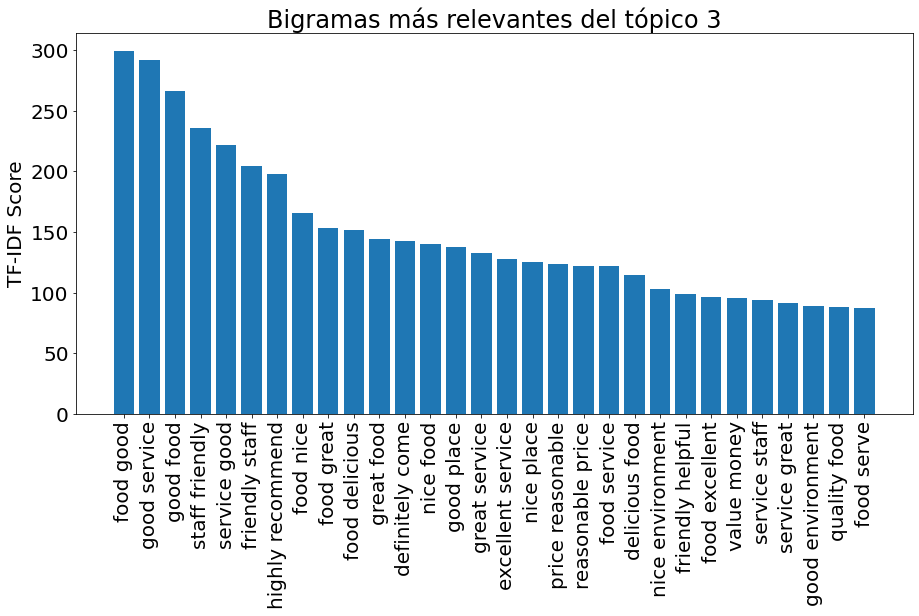

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 3')

In [ ]:
topic_4 = df_model[df_model['topic_dominant']==3] 
dft=topic_4['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

great place 87.37829352909051
good place 81.57885462068208
food good 80.04351829645695
nice place 78.20716146516097
staff friendly 73.63760774811423
friendly staff 73.13763481413574
good food 71.45644560497577
live music 68.67653080853566
happy hour 59.623799548555844
great food 54.743626363968914


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 4')

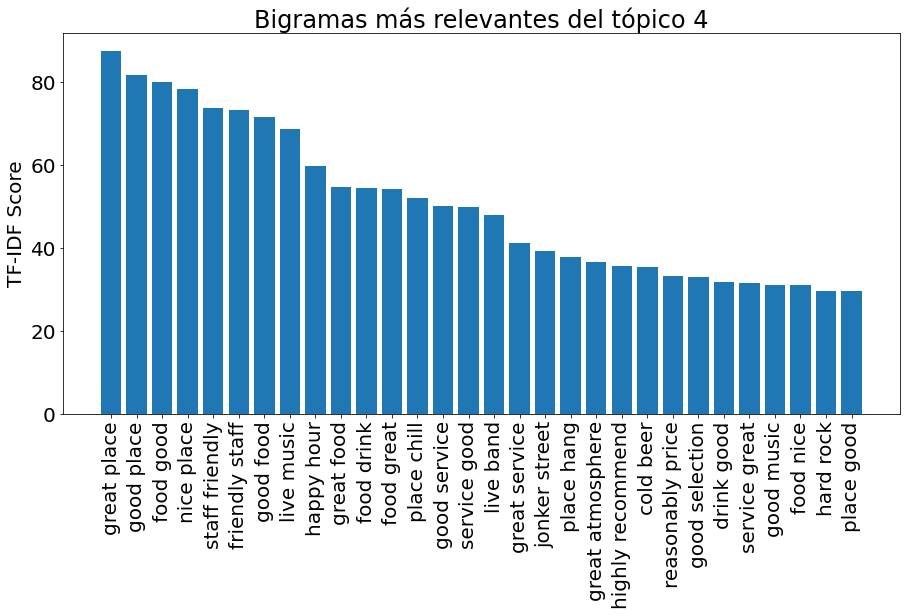

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 4')

In [ ]:
topic_5 = df_model[df_model['topic_dominant']==4] 
dft=topic_5['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good 23.068158926106474
staff friendly 21.900302338205474
dining experience 17.579728499654294
main course 16.206672147404593
fine dining 15.959406260422298
highly recommend 15.813078897813742
good food 15.35894053519658
food great 14.876809957151481
food excellent 14.523064243601784
wine list 14.204895147395183


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 5')

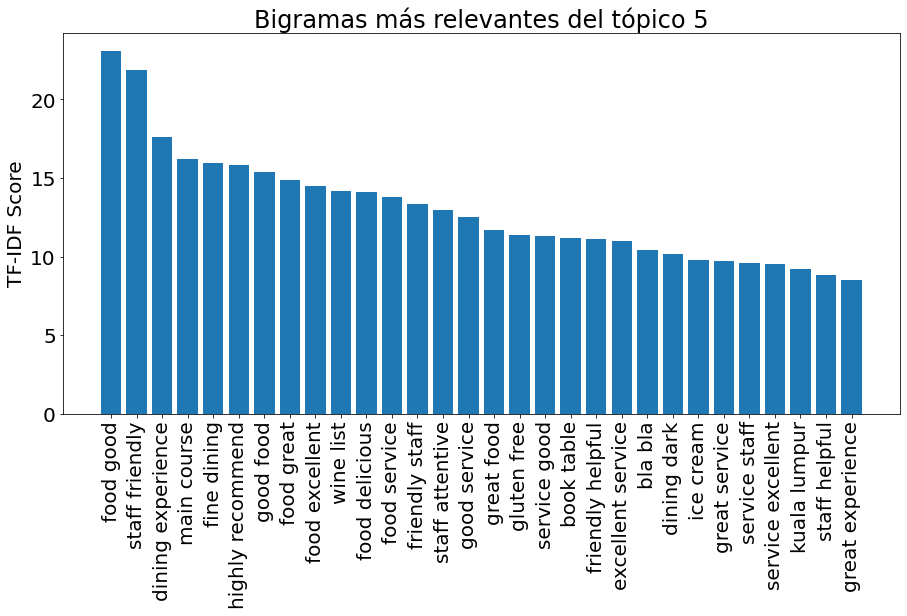

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 5')

In [ ]:
topic_6 = df_model[df_model['topic_dominant']==5] 
dft=topic_6['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good 82.29677097697271
food serve 52.306092312987204
good food 50.60341068209344
order food 43.689675161327465
dim sum 42.78688301693631
quality food 42.16540397121683
food average 39.55786556600352
service good 39.019343201039604
good service 38.23041369361573
food ok 37.329240692361296


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 6')

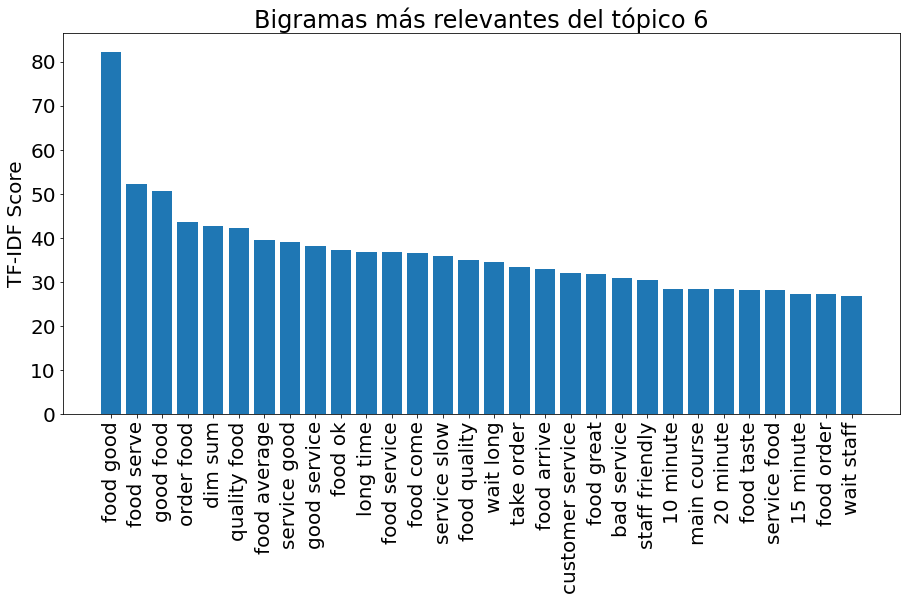

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 6')

In [ ]:
topic_7 = df_model[df_model['topic_dominant']==6] 
dft=topic_7['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

highly recommend 111.86019134591929
great service 102.46867136994489
food great 96.58244176153704
great food 92.7448253106499
excellent service 72.35616795549042
staff friendly 66.86754706046526
food amazing 64.97410843016112
food service 60.361783162207445
service great 58.214192498511224
good service 56.80959323909446


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 7')

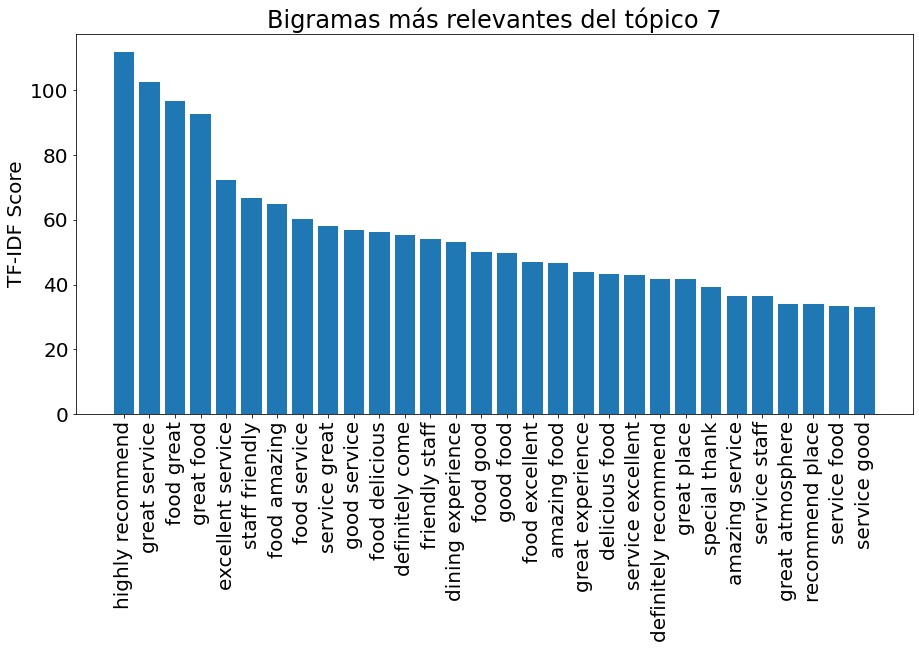

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 7')

In [ ]:
topic_8 = df_model[df_model['topic_dominant']==7] 
dft=topic_8['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(topic_8['lemmas'].values.astype('U'))
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi_2= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi_2.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good 127.36033265197851
kuala lumpur 110.25050658367759
good food 96.68053890472152
highly recommend 95.5641957260866
indian food 94.55264478061521
service good 72.75029132198017
good service 65.54975190403432
quality food 64.67583837999132
worth visit 61.34907486358375
food service 61.271320207363644


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 8')

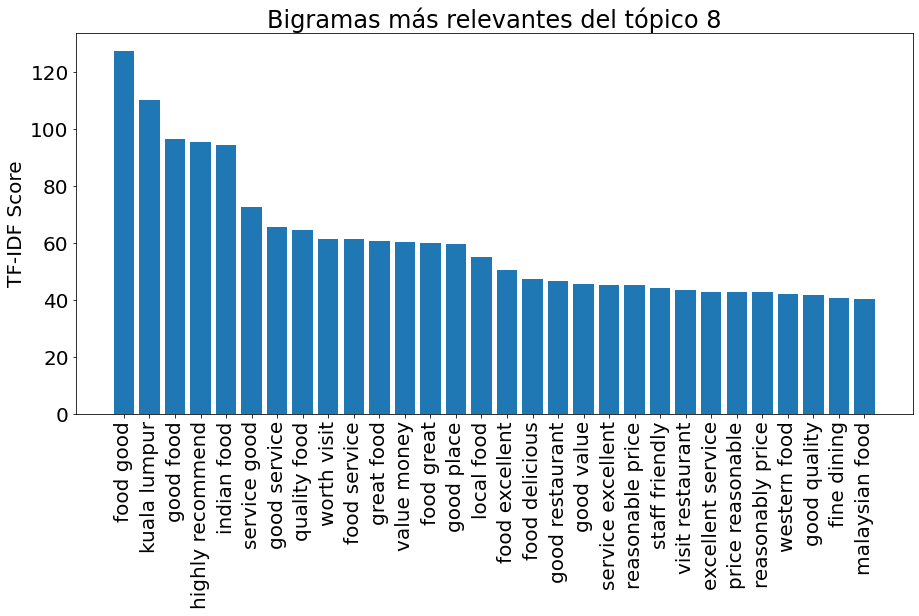

In [ ]:
results_sorted_bi=sorted(result_bi_2.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 8')

In [ ]:
topic_9 = df_model[df_model['topic_dominant']==8] 
dft=topic_9['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good 42.73005637524356
hard rock 35.40720898666436
price reasonable 32.43027393293239
good food 30.49100815372026
service good 28.003713555176518
reasonable price 27.428596269448125
dim sum 26.494271570598805
food average 22.356215697387537
good service 21.99650157911832
food ok 20.691197854706648


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 9')

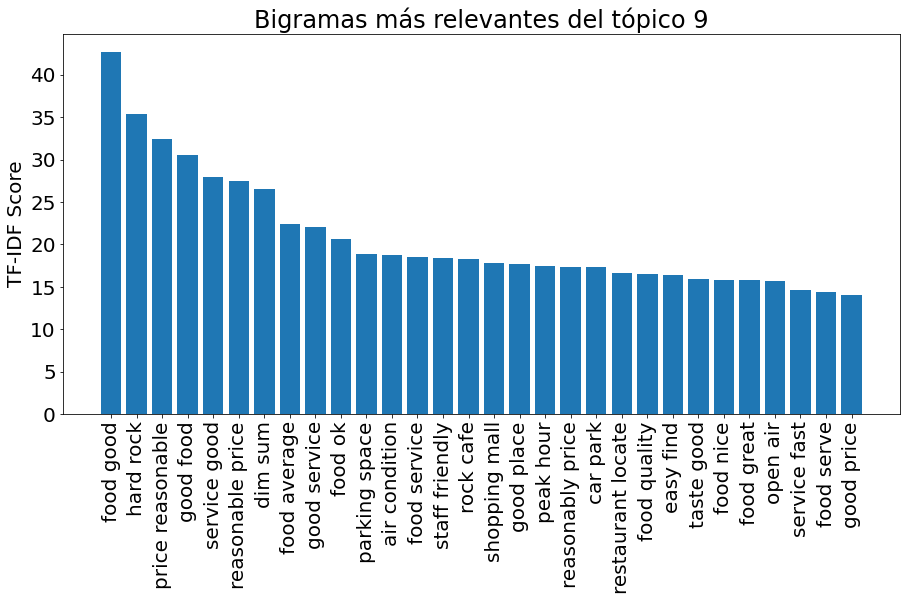

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 9')

In [ ]:
topic_10 = df_model[df_model['topic_dominant']==9] 
dft=topic_10['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


medium rare 23.793636716255115
pork rib 21.887558244849636
chicken chop 18.866628025411725
service good 18.668221831227864
good steak 17.146088696972626
rib eye 16.966272258744002
cook perfection 15.57627464602958
good service 15.110193331028405
fish chip 15.039405250580945
steak cook 14.480935291760296


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 10')

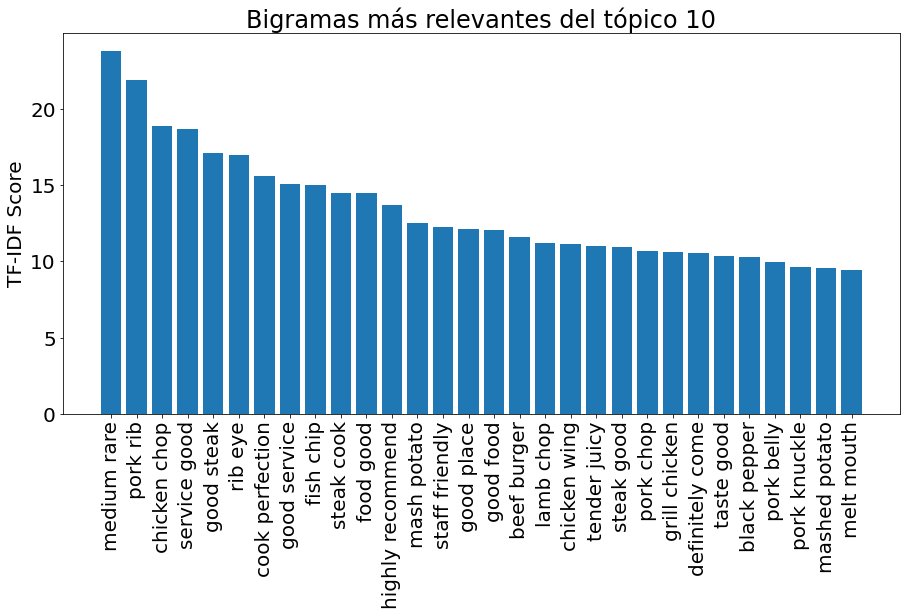

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 10')

In [ ]:
topic_11 = df_model[df_model['topic_dominant']==10] 
dft=topic_11['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


good service 37.95765005154958
excellent service 32.7254950378946
food good 31.005239225633954
great service 28.44568916894989
birthday celebration 27.16881096820925
good food 25.977049339696052
service good 24.17816767979425
chef steven 23.695012589691313
definitely come 23.42009236486974
food great 23.39105238178367


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 11')

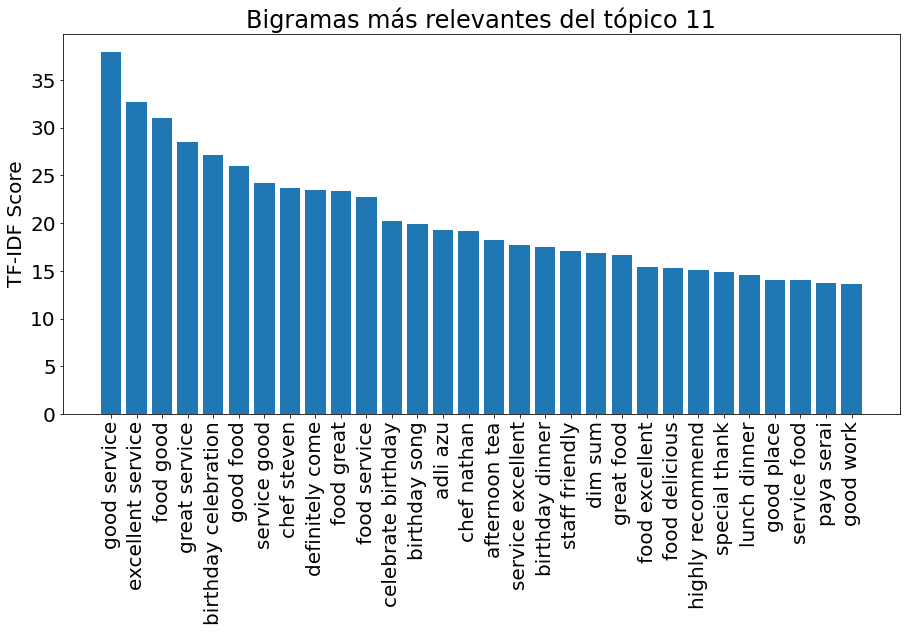

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 11')

In [ ]:
topic_12 = df_model[df_model['topic_dominant']==11] 
dft=topic_12['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


dim sum 115.23914291086692
char siew 42.16068150597911
fry rice 37.2198719289378
highly recommend 27.911031663128973
service good 27.65316254096416
salt egg 27.162846882948358
roast pork 26.96132351827922
taste good 26.819343660021254
food good 26.131309708170843
roast duck 25.823707214581486


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 12')

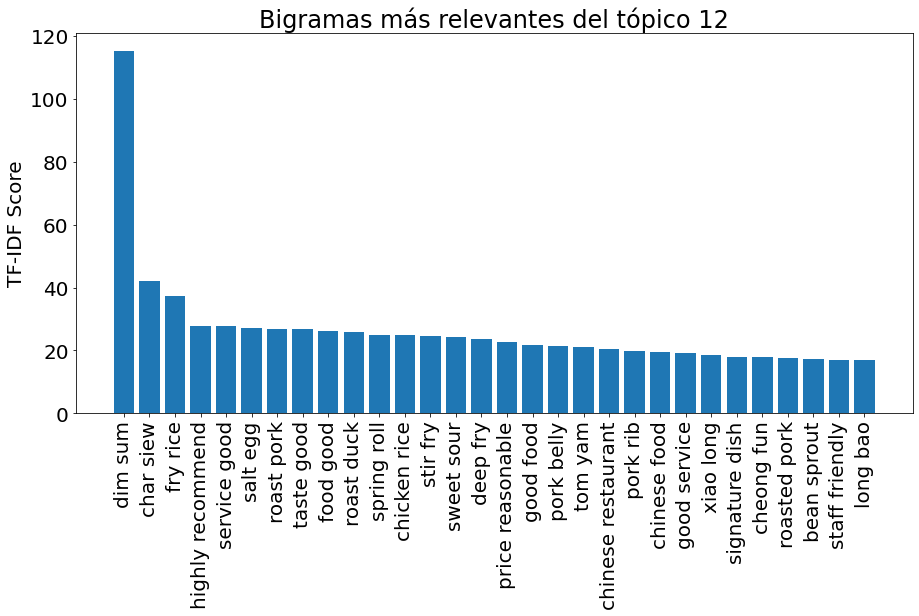

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 12')

In [ ]:
topic_13 = df_model[df_model['topic_dominant']==12] 
dft=topic_13['lemmas']
tfIdfVectorizer_bi=TfidfVectorizer(use_idf=True, ngram_range=(2,2))
tfIdf_bi = tfIdfVectorizer_bi.fit_transform(dft)
names_bi=tfIdfVectorizer_bi.get_feature_names()
freqs_bi = tfIdf_bi.sum(axis=0).A1
result_bi= dict(zip(names_bi, freqs_bi))

from operator import itemgetter
i = 0
results_sorted=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


dining experience 27.529437919231434
fine dining 18.651067843277605
japanese restaurant 17.6320718448213
highly recommend 15.570617998975525
japanese food 14.63519395602287
soft shell 13.168699080074223
food good 13.091494621413377
shell crab 13.002438068392282
main course 12.621046120833425
la carte 11.890877851095091


Text(0.5, 1.0, 'Bigramas más relevantes del tópico 13')

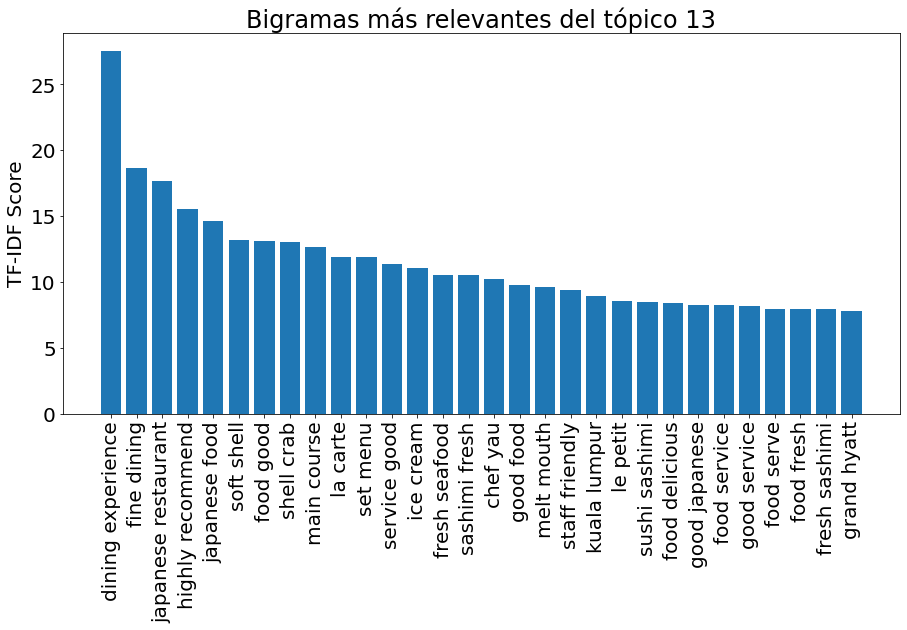

In [ ]:
results_sorted_bi=sorted(result_bi.items(), key = itemgetter(1), reverse = True)
df_results_bi=pd.DataFrame.from_dict(results_sorted_bi).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_bi[0],df_results_bi[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Bigramas más relevantes del tópico 13')

# Trigramas por tópico


In [ ]:
# Obtain trigrams for each topic
topic_1 = df_model[df_model['topic_dominant']==0] 
dft=topic_1['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

chicken rice ball 31.94167487024164
bak kut teh 30.516008938561793
curry fish head 17.944210161500987
banana leaf rice 15.089539759894423
fish head curry 14.36551187011118
char kway teow 11.304393143206333
char kuey teow 11.17502422761343
ayam buah keluak 10.198263505857417
north indian food 10.1616471231115
soft shell crab 8.670069075121067


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 1')

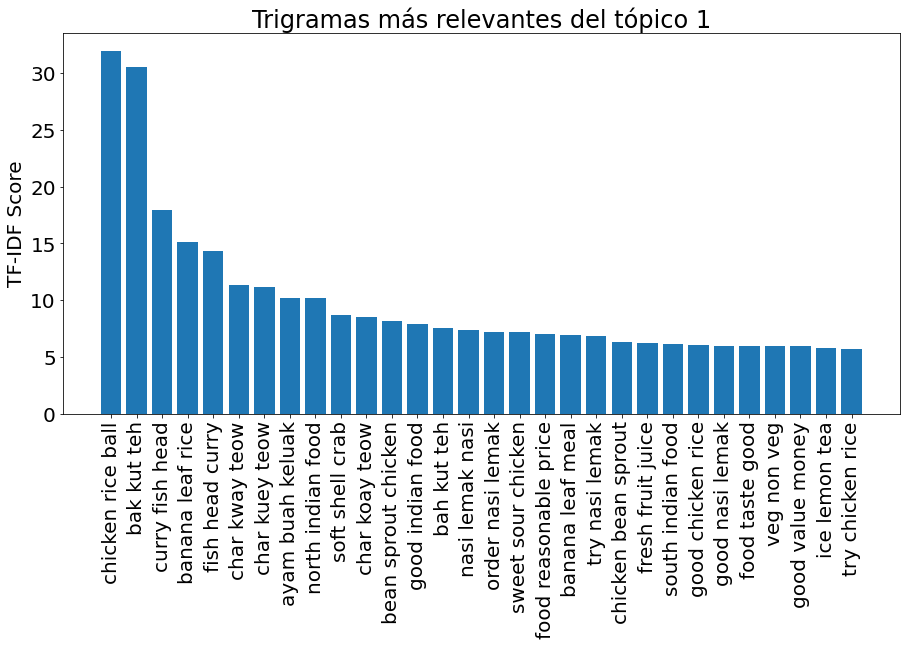

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 1')

In [ ]:
topic_2 = df_model[df_model['topic_dominant']==1] 
dft=topic_2['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(topic_2['lemmas'].values.astype('U'))
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

vanilla ice cream 8.500145414244562
chocolate lava cake 7.075741484414834
squid ink pasta 6.630580722311831
thin crust pizza 5.419938012076833
main course dessert 5.076679192647544
french onion soup 4.8497970336180245
coconut ice cream 4.199574204268335
starter main course 4.066337393195423
cake ice cream 4.04855149202973
italian restaurant kl 3.734993337337349


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 2')

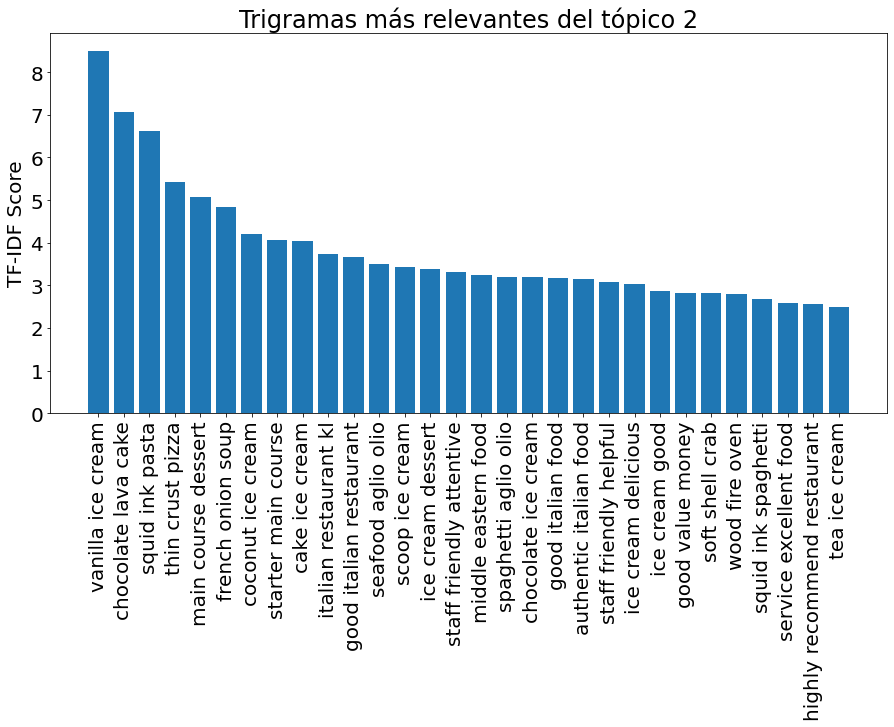

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 2')

In [ ]:
topic_3 = df_model[df_model['topic_dominant']==2] 
dft=topic_3['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good service 73.5666066853924
good food good 56.02184069214732
good service good 49.44127768699055
staff friendly helpful 47.23445251806404
service good food 45.39310709735066
food great service 42.18178619943813
food reasonable price 36.261062893272346
food excellent service 32.97261160800462
good value money 32.932543002086135
friendly staff good 29.641013033658933


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 3')

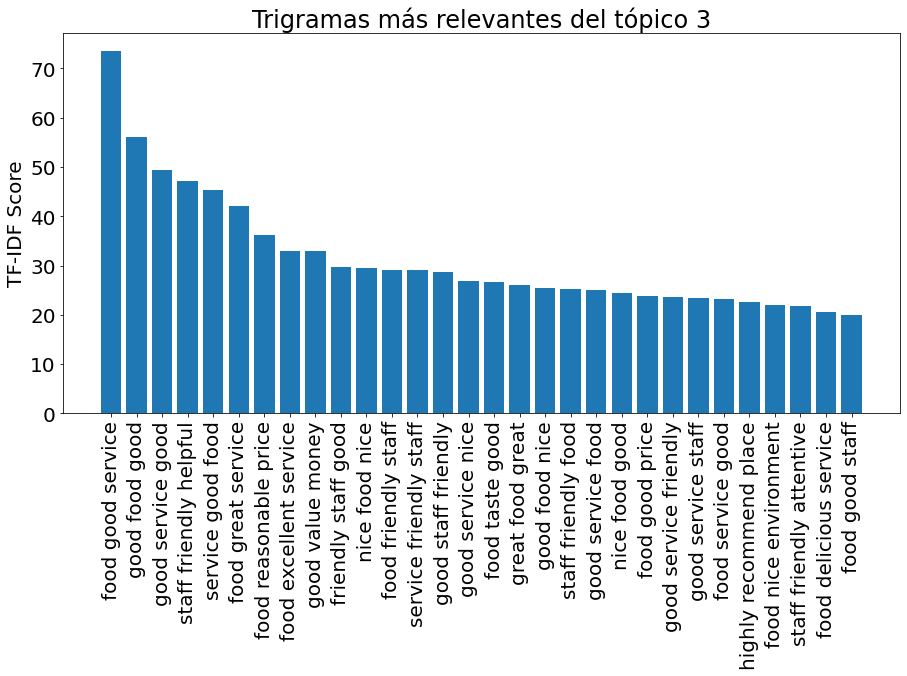

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 3')

In [ ]:
topic_4 = df_model[df_model['topic_dominant']==3] 
dft=topic_4['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

nice place chill 17.954313196927323
good place chill 14.313666163950945
hard rock cafe 14.310230100425963
staff friendly helpful 11.894032139196304
good food good 11.57645348646224
great food great 11.306428791991811
great place chill 10.6736593751829
good place hang 10.5071449024471
place hang friend 10.405305748600803
great place hang 10.224826754044836


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 4')

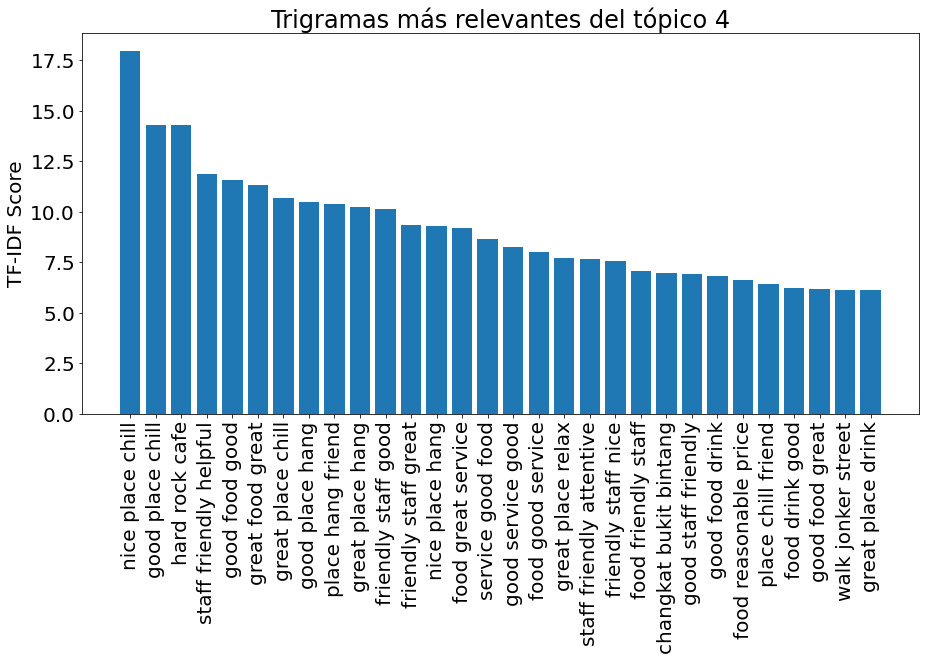

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 4')

In [ ]:
topic_5 = df_model[df_model['topic_dominant']==4] 
dft=topic_5['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

bla bla bla 5.038751696641791
staff friendly helpful 4.905335270344592
food good service 4.225872577060962
fine dining restaurant 3.666003182798154
fine dining experience 3.3097462054488433
casa del mar 3.2187959192919253
food excellent service 2.830307716580328
food great service 2.595190181644865
highly recommend restaurant 2.5359855284550528
staff friendly attentive 2.4959614012685396


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 5')

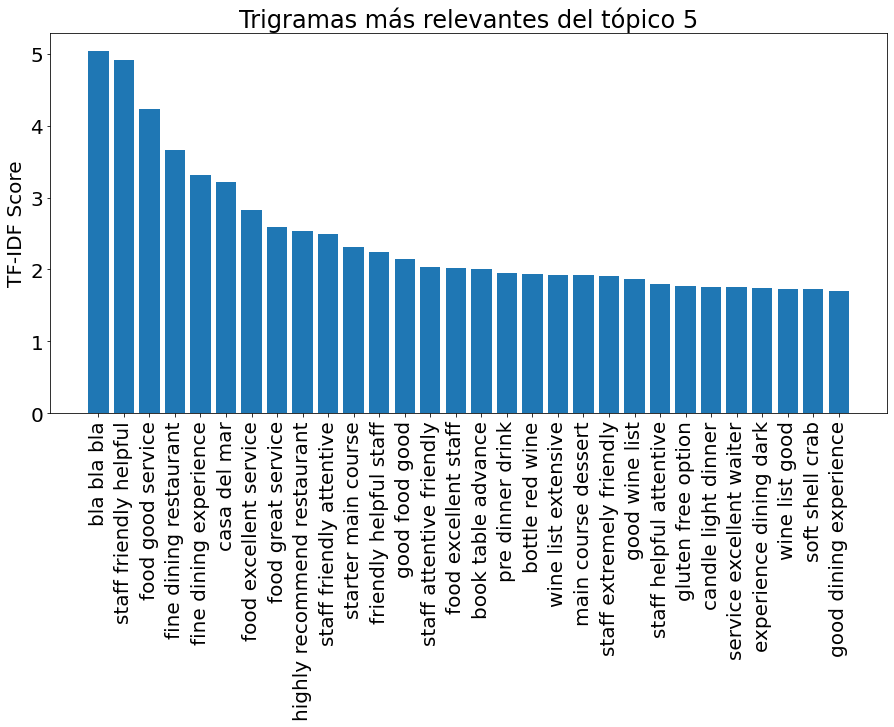

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 5')

In [ ]:
topic_6 = df_model[df_model['topic_dominant']==5] 
dft=topic_6['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good service 11.563985103920489
take long time 11.31249118010851
wait long time 9.7514151858058
wait half hour 8.066238058198282
10 service charge 8.049839995282845
wait 20 minute 7.70267712764595
wait 15 minute 7.5235586582739415
hard rock cafe 7.252780455561453
wait 30 minute 7.143110967576125
wait 10 minute 6.905445372063367


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 6')

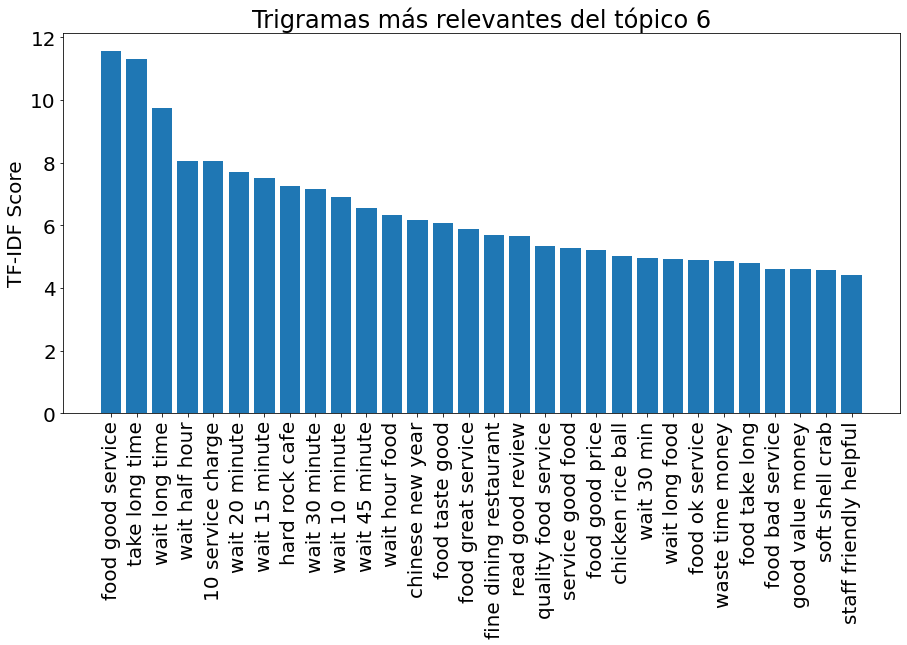

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 6')

In [ ]:
topic_7 = df_model[df_model['topic_dominant']==6] 
dft=topic_7['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food great service 31.927717206691288
great food great 25.8169783959464
food excellent service 16.488952623973447
highly recommend place 13.602909927270154
food good service 12.980835661365054
great service great 12.93934625665495
service great food 12.036183221371635
food amazing service 11.113544023539433
great dining experience 9.97645881460313
highly recommend visit 9.571766740723493


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 7')

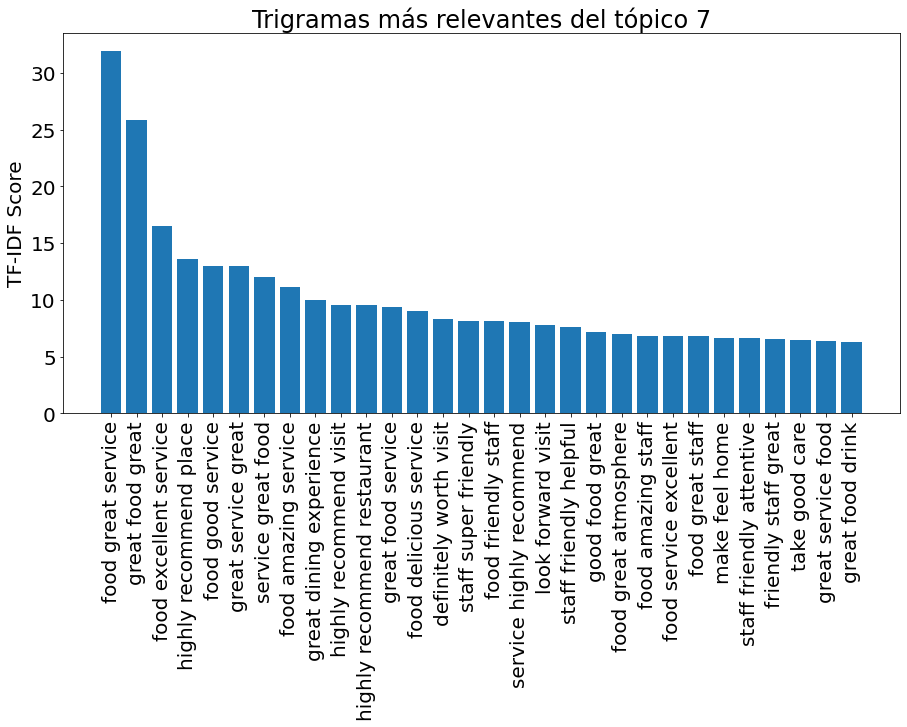

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 7')

In [ ]:
topic_8 = df_model[df_model['topic_dominant']==7] 
dft=topic_8['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(topic_8['lemmas'].values.astype('U'))
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

food good service 20.28407437474198
good value money 18.75891422876438
restaurant kuala lumpur 18.03462213038838
food reasonable price 15.481395624863142
good indian food 14.665753469123715
definitely worth visit 14.131465486099474
south indian food 14.059133301321303
service good food 14.036598581135728
food good price 13.490645943537288
good food good 12.925794922315275


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 8')

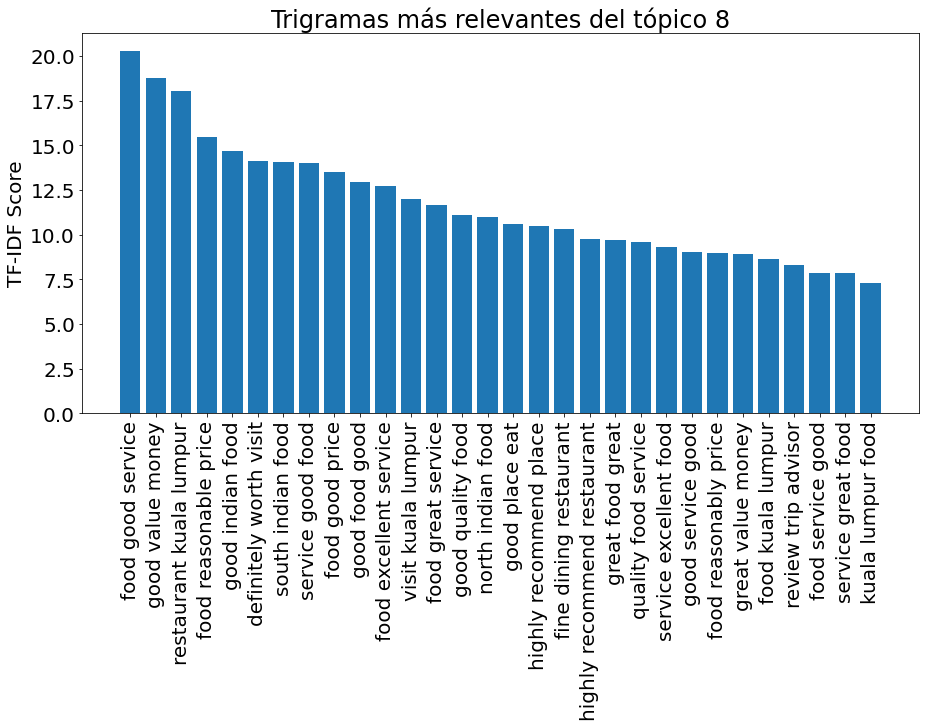

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 8')

In [ ]:
topic_9 = df_model[df_model['topic_dominant']==8] 
dft=topic_9['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

hard rock cafe 17.181197951601252
food reasonable price 8.68305098103767
food good service 7.15631310345951
food good price 5.507148327395516
weekend public holiday 4.862935200683441
service good food 4.692462413011
ample parking space 4.446893530904633
food taste good 4.356112092797529
food reasonably price 4.278844270595632
good food good 4.103940497696901


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 9')

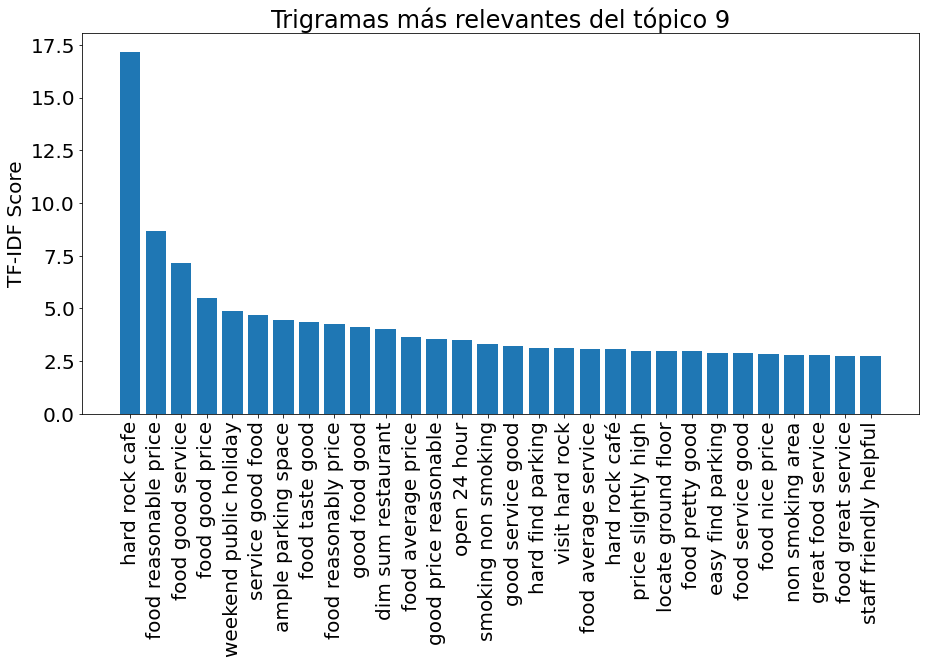

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 9')

In [ ]:
topic_10 = df_model[df_model['topic_dominant']==9] 
dft=topic_10['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


rib eye steak 7.368223216490161
black pepper sauce 5.264615771091243
steak cook perfection 5.195716713182945
cook medium rare 4.4498056508185115
order medium rare 3.8231759562874164
steak medium rare 3.319941194744801
pork belly burger 3.0635783305357855
steak cook perfectly 2.979952467785076
grill chicken chop 2.961443852453985
good value money 2.9614363133616046


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 10')

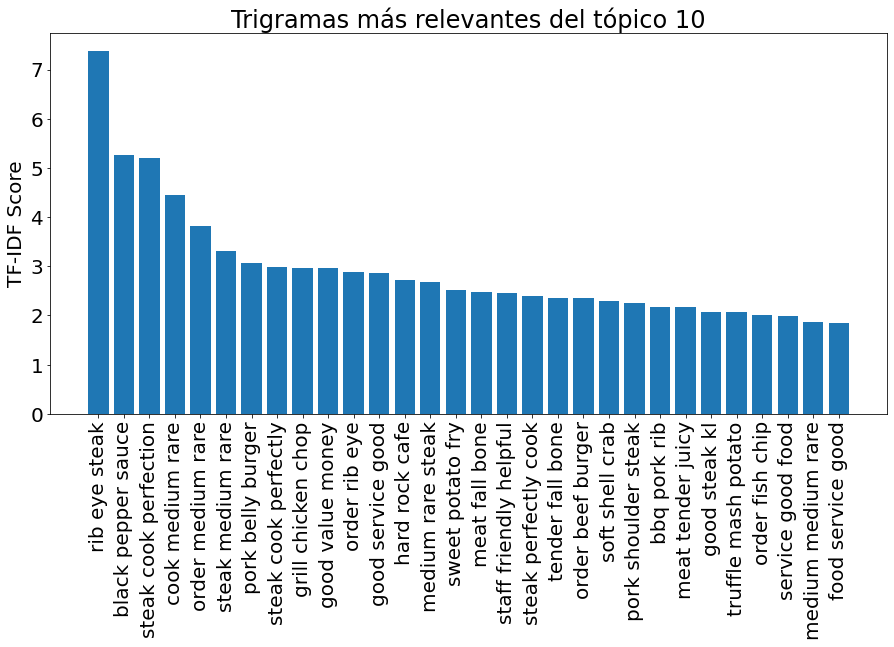

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 10')

In [ ]:
topic_11 = df_model[df_model['topic_dominant']==10] 
dft=topic_11['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

sing birthday song 8.257209170341696
food good service 7.8214562720033
food great service 7.259588632347033
chef steven nathan 6.909147685507553
steven nathan haziq 6.8984081867912215
chef nathan chef 6.3979004711593195
food excellent service 6.125779664293006
celebrate friend birthday 5.888475102709418
adli azu chef 5.38929567357813
chef steven haziq 5.191237813489512


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 11')

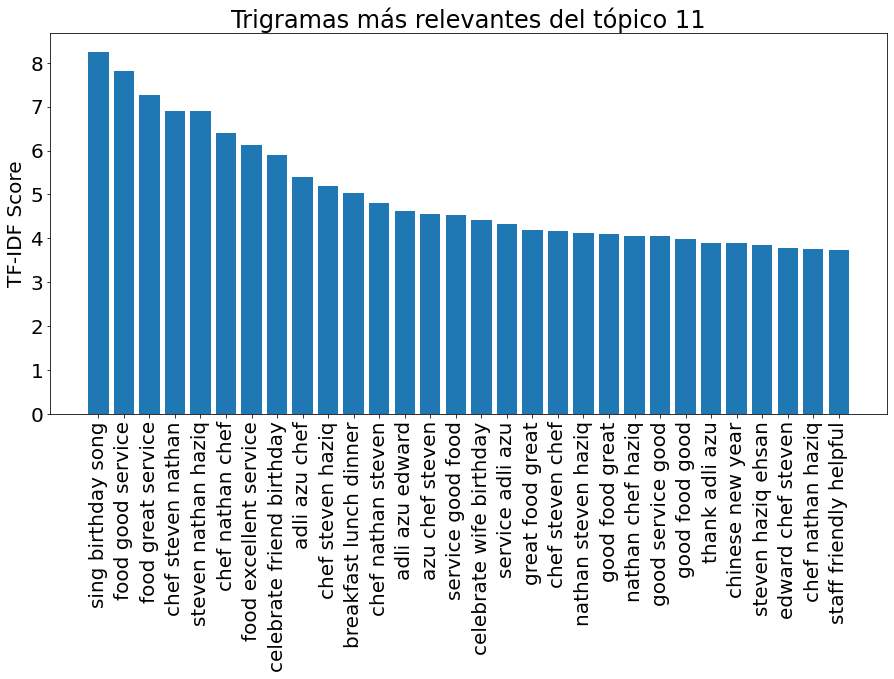

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 11')

In [ ]:
topic_12 = df_model[df_model['topic_dominant']==11] 
dft=topic_12['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


xiao long bao 14.472552505476516
chee cheong fun 12.407258598185177
dim sum restaurant 9.964856739749845
tom yam soup 9.67271739068305
soft shell crab 8.778380361780822
good dim sum 8.728387416681672
halal dim sum 7.6118932180582455
dim sum place 7.537731590785113
sweet sour pork 7.252388688888749
dim sum good 6.855184583455078


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 12')

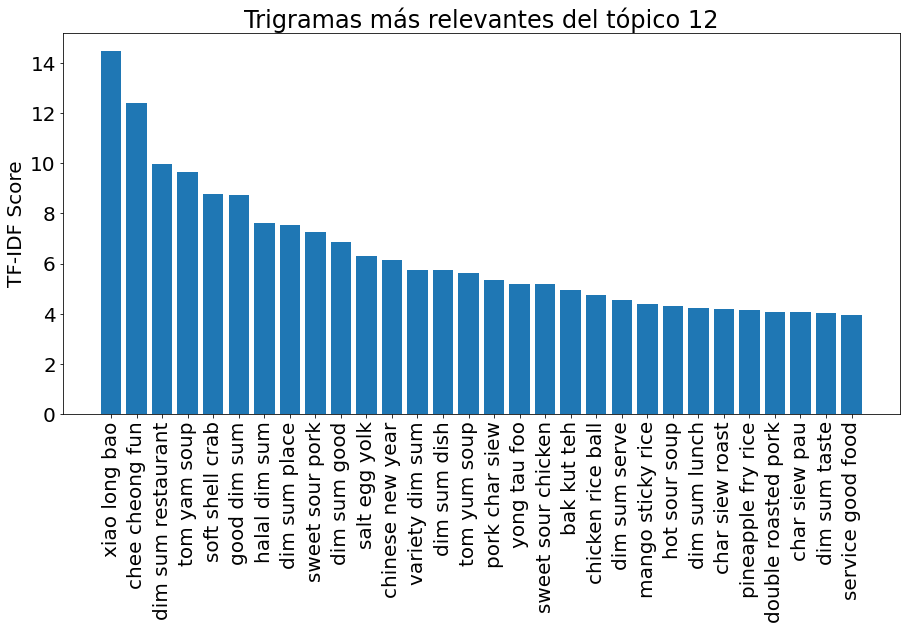

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 12')

In [ ]:
topic_13 = df_model[df_model['topic_dominant']==12] 
dft=topic_13['lemmas']
tfIdfVectorizer_tri=TfidfVectorizer(use_idf=True, ngram_range=(3,3))
tfIdf_tri = tfIdfVectorizer_tri.fit_transform(dft)
names_tri= tfIdfVectorizer_tri.get_feature_names()
freqs_tri = tfIdf_tri.sum(axis=0).A1
result_tri = dict(zip(names_tri, freqs_tri))

from operator import itemgetter
i = 0
results_sorted=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
for key, value in results_sorted:
    i += 1
    if i == 11:
      break
    print(key, value)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


soft shell crab 11.90694724971315
le petit chef 6.737904226237032
casa del mar 5.010452238959738
fine dining experience 4.389989913862224
fine dining restaurant 4.1975054314259825
la carte menu 3.97709885799648
good japanese restaurant 3.7131528622264627
ala carte menu 3.404379290453781
unique dining experience 2.7674908359868793
good japanese food 2.3866568610221757


Text(0.5, 1.0, 'Trigramas más relevantes del tópico 13')

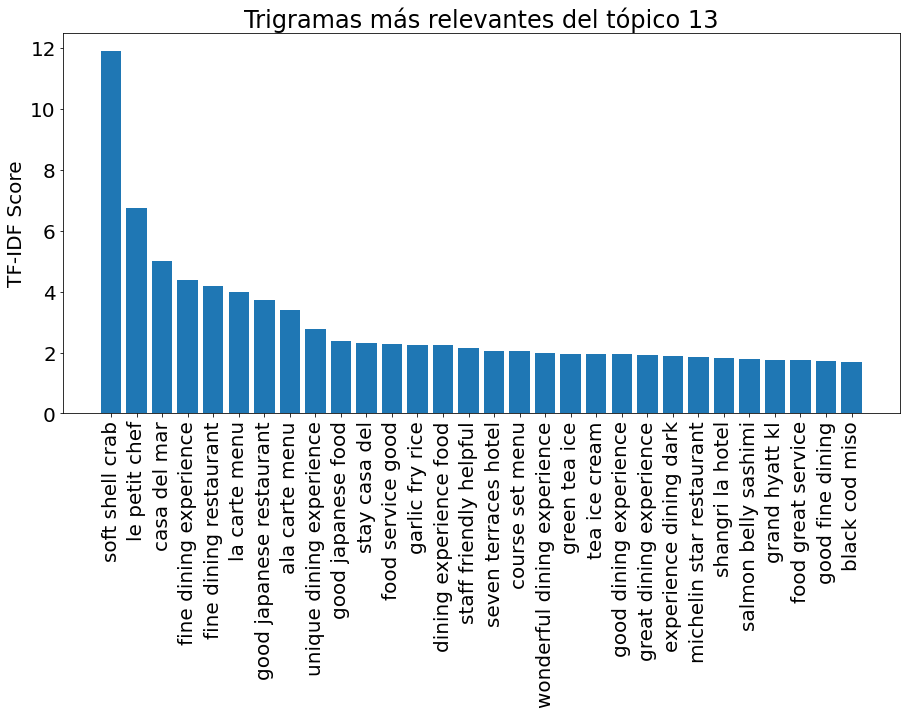

In [ ]:
results_sorted_tri=sorted(result_tri.items(), key = itemgetter(1), reverse = True)
df_results_tri=pd.DataFrame.from_dict(results_sorted_tri).head(30)
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(15,7))
plt.bar(df_results_tri[0],df_results_tri[1])
plt.xticks(rotation=90)
plt.ylabel('TF-IDF Score')
plt.title('Trigramas más relevantes del tópico 13')

# Análisis de Sentimientos


In [ ]:
# Load data
df_sentiment = pd.read_csv('Restauracion.csv', index_col=False)

In [ ]:
# Load data
df_topics=pd.read_csv('topic_model_results_res.csv', index_col=False)

In [ ]:
df_sentiment

,Unnamed: 0,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras
0,0,kmc1e2018,Chambers Bar and Grill,David Thanga Mikail and Chef Steven gave brill...,5.0,Reviewed yesterday,Chambers Grill,KL,16
1,1,MizOthmanKuala Lumpur Malaysia,Always a pleasure. Place to celebrate.,We visited for family celebration and as usual...,5.0,Reviewed 5 days ago,Chambers Grill,KL,47
2,2,Relax36268533224Hjarno Denmark,Enjoying good service and good food after a lo...,Perfect dinner after a long journey.After trav...,5.0,Reviewed 1 week ago,Chambers Grill,KL,49
3,3,tstrry,Great Steak for Couples,Had a great Tomahawk for me and hubby thanks t...,5.0,Reviewed 1 week ago,Chambers Grill,KL,40
4,4,Naim_123456789,Dining,Excellent ambient. Excellent service by David ...,5.0,Reviewed 1 week ago,Chambers Grill,KL,20
...,...,...,...,...,...,...,...,...,...
139759,139759,Tomz1972,Standard hotel breakfast,There's a strange smell from there strongest a...,3.0,Reviewed 23 March 2013,Infusion,JB,37
139760,139760,mimie_amelliasingapore,Good place!,After reading about their negative comments i ...,4.0,Reviewed 12 February 2013,Infusion,JB,97
139761,139761,Jeff1551,Breakfast,Breakfast is good with plenty of varieties. Th...,4.0,Reviewed 11 January 2013,Infusion,JB,24
139762,139762,Rezzqi,Huge selection,Buffet dinner. Spacious dining area inside KSL...,4.0,Reviewed 16 December 2012,Infusion,JB,35


In [ ]:
df_sentiment ['cleaned_text']=df_sentiment['Review']
df_sentiment

,Unnamed: 0,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras,cleaned_text
0,0,kmc1e2018,Chambers Bar and Grill,David Thanga Mikail and Chef Steven gave brill...,5.0,Reviewed yesterday,Chambers Grill,KL,16,David Thanga Mikail and Chef Steven gave brill...
1,1,MizOthmanKuala Lumpur Malaysia,Always a pleasure. Place to celebrate.,We visited for family celebration and as usual...,5.0,Reviewed 5 days ago,Chambers Grill,KL,47,We visited for family celebration and as usual...
2,2,Relax36268533224Hjarno Denmark,Enjoying good service and good food after a lo...,Perfect dinner after a long journey.After trav...,5.0,Reviewed 1 week ago,Chambers Grill,KL,49,Perfect dinner after a long journey.After trav...
3,3,tstrry,Great Steak for Couples,Had a great Tomahawk for me and hubby thanks t...,5.0,Reviewed 1 week ago,Chambers Grill,KL,40,Had a great Tomahawk for me and hubby thanks t...
4,4,Naim_123456789,Dining,Excellent ambient. Excellent service by David ...,5.0,Reviewed 1 week ago,Chambers Grill,KL,20,Excellent ambient. Excellent service by David ...
...,...,...,...,...,...,...,...,...,...,...
139759,139759,Tomz1972,Standard hotel breakfast,There's a strange smell from there strongest a...,3.0,Reviewed 23 March 2013,Infusion,JB,37,There's a strange smell from there strongest a...
139760,139760,mimie_amelliasingapore,Good place!,After reading about their negative comments i ...,4.0,Reviewed 12 February 2013,Infusion,JB,97,After reading about their negative comments i ...
139761,139761,Jeff1551,Breakfast,Breakfast is good with plenty of varieties. Th...,4.0,Reviewed 11 January 2013,Infusion,JB,24,Breakfast is good with plenty of varieties. Th...
139762,139762,Rezzqi,Huge selection,Buffet dinner. Spacious dining area inside KSL...,4.0,Reviewed 16 December 2012,Infusion,JB,35,Buffet dinner. Spacious dining area inside KSL...


In [ ]:
# Load data
a = pd.read_csv('Lemmas_Restauracion.csv', index_col=False)

In [ ]:
df_sentiment['lemmas'] = a['lemmas']

In [ ]:
# Select the colums needed from the dataset
df_topics= df_topics.iloc[:,[1,2,3,4]]
df_topics

,lemmas,tokens,lda_features,topic_dominant
0,david thanga mikail chef steven give brilliant...,"['david', 'thanga', 'mikail', 'chef', 'steven'...",[0.00641027 0.00641029 0.25263378 0.00641028 0...,10
1,visit family celebration usual restaurant disa...,"['visit', 'family', 'celebration', 'usual', 'r...",[0.00284904 0.05481938 0.21493457 0.00284903 0...,10
2,perfect dinner long journey travel dk kuala lu...,"['perfect', 'dinner', 'long', 'journey', 'trav...",[0.00295861 0.00295861 0.13157605 0.00295862 0...,10
3,great tomahawk hubby thank david azzu great ch...,"['great', 'tomahawk', 'hubby', 'thank', 'david...",[0.00366302 0.00366303 0.06231878 0.00366303 0...,10
4,excellent ambient excellent service david than...,"['excellent', 'ambient', 'excellent', 'service...",[0.00591717 0.00591719 0.32867604 0.0059172 0...,10
...,...,...,...,...
139759,strange smell strong tower lift lobby food sta...,"['strange', 'smell', 'strong', 'tower', 'lift'...",[0.00366307 0.00366303 0.00366305 0.00366307 0...,5
139760,read negative comment personally think massive...,"['read', 'negative', 'comment', 'personally', ...",[0.00183152 0.00183151 0.00183154 0.00183153 0...,5
139761,breakfast good plenty variety staff helpful fr...,"['breakfast', 'good', 'plenty', 'variety', 'st...",[0.35993072 0.00549453 0.46133941 0.00549458 0...,2
139762,buffet dinner spacious dining area inside ksl ...,"['buffet', 'dinner', 'spacious', 'dining', 'ar...",[0.31171462 0.10651805 0.00284906 0.00284905 0...,8


In [ ]:
# Merge in one df all the information needed
df_topics_complete=pd.merge(df_sentiment,df_topics,on='lemmas',how='left')
df_topics_complete

,Unnamed: 0,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras,cleaned_text,lemmas,tokens,lda_features,topic_dominant
0,0,kmc1e2018,Chambers Bar and Grill,David Thanga Mikail and Chef Steven gave brill...,5.0,Reviewed yesterday,Chambers Grill,KL,16,David Thanga Mikail and Chef Steven gave brill...,david thanga mikail chef steven give brilliant...,"['david', 'thanga', 'mikail', 'chef', 'steven'...",[0.00641027 0.00641029 0.25263378 0.00641028 0...,10
1,1,MizOthmanKuala Lumpur Malaysia,Always a pleasure. Place to celebrate.,We visited for family celebration and as usual...,5.0,Reviewed 5 days ago,Chambers Grill,KL,47,We visited for family celebration and as usual...,visit family celebration usual restaurant disa...,"['visit', 'family', 'celebration', 'usual', 'r...",[0.00284904 0.05481938 0.21493457 0.00284903 0...,10
2,2,Relax36268533224Hjarno Denmark,Enjoying good service and good food after a lo...,Perfect dinner after a long journey.After trav...,5.0,Reviewed 1 week ago,Chambers Grill,KL,49,Perfect dinner after a long journey.After trav...,perfect dinner long journey travel dk kuala lu...,"['perfect', 'dinner', 'long', 'journey', 'trav...",[0.00295861 0.00295861 0.13157605 0.00295862 0...,10
3,3,tstrry,Great Steak for Couples,Had a great Tomahawk for me and hubby thanks t...,5.0,Reviewed 1 week ago,Chambers Grill,KL,40,Had a great Tomahawk for me and hubby thanks t...,great tomahawk hubby thank david azzu great ch...,"['great', 'tomahawk', 'hubby', 'thank', 'david...",[0.00366302 0.00366303 0.06231878 0.00366303 0...,10
4,4,Naim_123456789,Dining,Excellent ambient. Excellent service by David ...,5.0,Reviewed 1 week ago,Chambers Grill,KL,20,Excellent ambient. Excellent service by David ...,excellent ambient excellent service david than...,"['excellent', 'ambient', 'excellent', 'service...",[0.00591717 0.00591719 0.32867604 0.0059172 0...,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142371,139759,Tomz1972,Standard hotel breakfast,There's a strange smell from there strongest a...,3.0,Reviewed 23 March 2013,Infusion,JB,37,There's a strange smell from there strongest a...,strange smell strong tower lift lobby food sta...,"['strange', 'smell', 'strong', 'tower', 'lift'...",[0.00366307 0.00366303 0.00366305 0.00366307 0...,5
142372,139760,mimie_amelliasingapore,Good place!,After reading about their negative comments i ...,4.0,Reviewed 12 February 2013,Infusion,JB,97,After reading about their negative comments i ...,read negative comment personally think massive...,"['read', 'negative', 'comment', 'personally', ...",[0.00183152 0.00183151 0.00183154 0.00183153 0...,5
142373,139761,Jeff1551,Breakfast,Breakfast is good with plenty of varieties. Th...,4.0,Reviewed 11 January 2013,Infusion,JB,24,Breakfast is good with plenty of varieties. Th...,breakfast good plenty variety staff helpful fr...,"['breakfast', 'good', 'plenty', 'variety', 'st...",[0.35993072 0.00549453 0.46133941 0.00549458 0...,2
142374,139762,Rezzqi,Huge selection,Buffet dinner. Spacious dining area inside KSL...,4.0,Reviewed 16 December 2012,Infusion,JB,35,Buffet dinner. Spacious dining area inside KSL...,buffet dinner spacious dining area inside ksl ...,"['buffet', 'dinner', 'spacious', 'dining', 'ar...",[0.31171462 0.10651805 0.00284906 0.00284905 0...,8


In [ ]:
# Tokenize the data
def tokenize(text):
    text = str(text)
    tokens = text.split() # Make text lowercase and split it
    return tokens
df_topics_complete ['tokens'] = df_topics_complete['cleaned_text'].apply(tokenize)
print(df_topics_complete.head())

   Unnamed: 0                          Author  \
0           0                       kmc1e2018   
1           1  MizOthmanKuala Lumpur Malaysia   
2           2  Relax36268533224Hjarno Denmark   
3           3                          tstrry   
4           4                  Naim_123456789   

                                               Title  \
0                             Chambers Bar and Grill   
1             Always a pleasure. Place to celebrate.   
2  Enjoying good service and good food after a lo...   
3                            Great Steak for Couples   
4                                             Dining   

                                              Review  Rating  \
0  David Thanga Mikail and Chef Steven gave brill...     5.0   
1  We visited for family celebration and as usual...     5.0   
2  Perfect dinner after a long journey.After trav...     5.0   
3  Had a great Tomahawk for me and hubby thanks t...     5.0   
4  Excellent ambient. Excellent service by David

In [ ]:
df_topics_complete['cleaned_text']

0         David Thanga Mikail and Chef Steven gave brill...
1         We visited for family celebration and as usual...
2         Perfect dinner after a long journey.After trav...
3         Had a great Tomahawk for me and hubby thanks t...
4         Excellent ambient. Excellent service by David ...
                                ...                        
142371    There's a strange smell from there strongest a...
142372    After reading about their negative comments i ...
142373    Breakfast is good with plenty of varieties. Th...
142374    Buffet dinner. Spacious dining area inside KSL...
142375    Situated conveniently on the 2nd floor of KSL ...
Name: cleaned_text, Length: 142376, dtype: object

In [ ]:
# Funtion to analyze the score
def tweet_scores(data_frame): 
  
    # Create a SentimentIntensityAnalyzer object. 
    sid_obj = SentimentIntensityAnalyzer()
    scores = []
    n = data_frame.shape[0]
    for i in range(n):
      sentence = data_frame.iloc[i]
      sentiment_dict = sid_obj.polarity_scores(sentence)
      compound = sentiment_dict['compound']
      scores.append(compound)
    return scores


In [ ]:
# Apply the previous function to our data
df_topics_complete['scores']=tweet_scores(df_topics_complete['cleaned_text'])

In [ ]:
d = {'date': df_sentiment['Dates'], 'palabras': df_sentiment['Numero de palabras']}
df = pd.DataFrame(data=d)

In [ ]:
# Save data to csv
df.to_csv('Restauracion_fechas.csv')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('Reviewed','')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('5 weeks ago','15 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('4 weeks ago','8 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('3 weeks ago','1 May 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('2 weeks ago','24 April 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('1 week ago','17 April 2022')

In [ ]:
# Make sure all date information is in Day Month Year format
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('5 days ago','15 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('4 days ago','14 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('3 days ago','13 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('6 days ago','16 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('2 days ago','12 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('yesterday','11 April 2022')
df_topics_complete['Dates'] = df_topics_complete['Dates'].str.replace('today','10 April 2022')

In [ ]:
# Make sure all date type data is in the same format 
df_topics_complete['date_2'] = df_topics_complete['Dates'].astype('datetime64[ns]')

In [ ]:
#Save data
df_topics_complete.to_csv('Restauracion_SA_complete.csv')

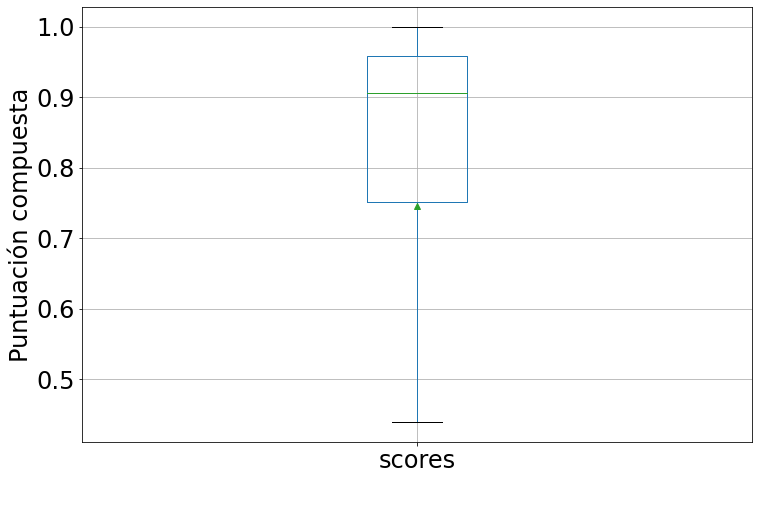

In [ ]:
# Boxplot of the compound score obtained
df_topics_complete = pd.read_csv('Restauracion_SA_complete.csv', index_col=False)
ax1 = df_topics_complete.boxplot(column='scores', figsize=(12,8), showmeans=True, showfliers=False, fontsize=24) #~eliminando outliers
ax1.set_ylabel('Puntuación compuesta', fontsize=24)
ax1.set_xlabel(' ', fontsize=24)
plt.show() 

In [ ]:
# Group the scores per date
df_bygroup=pd.DataFrame(df_topics_complete.groupby(['date_2'])['scores'].agg('sum'))

In [ ]:
# Index and save the data
df_bygroup['date_2']=df_bygroup.index

df_bygroup.to_csv('Restauracion_SA_dates.csv')
df_bygroup

,scores,date_2
date_2,,
2008-01-02,0.4927,2008-01-02
2008-05-26,0.8381,2008-05-26
2008-07-12,0.6588,2008-07-12
2008-08-18,0.9904,2008-08-18
2008-08-26,-0.0150,2008-08-26
...,...,...
2022-05-01,106.2618,2022-05-01
2022-05-08,121.9956,2022-05-08
2022-05-12,0.7906,2022-05-12


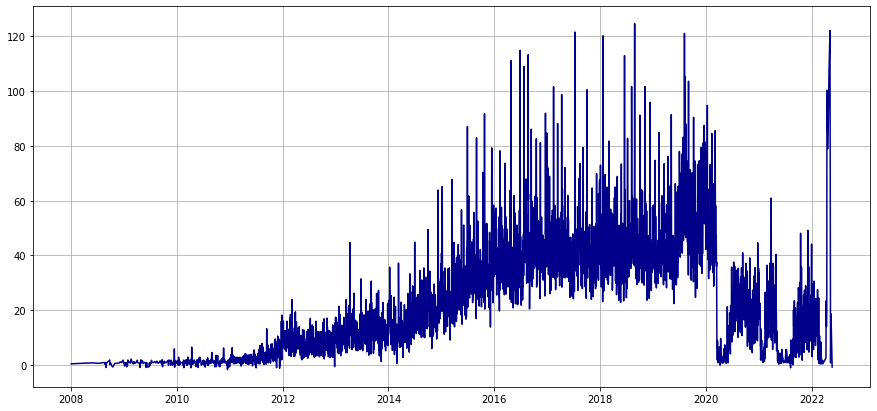

In [ ]:
# Show sentiment evolution
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date_2'],df_bygroup['scores'],color="darkblue")

plt.grid()
plt.show()

In [ ]:
# Describe the data obtained
df_topics_complete['scores'].describe()

count    142376.000000
mean          0.745872
std           0.398707
min          -0.997200
25%           0.750600
50%           0.906100
75%           0.958400
max           0.999900
Name: scores, dtype: float64

# Gráficos por tópico


In [ ]:
# Obtain the evolution of the sentiment through the years for each topic
topic_1_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==0] 
topic_1_sentiment

,Unnamed: 0,Author,Title,Review,Rating,Dates,Restaurant,Location,Numero de palabras,cleaned_text,lemmas,tokens,lda_features,topic_dominant,scores,date_2
947,947,moshahriz,Good food good service good location,Recommended for family with small children due...,5.0,27 February 2021,Positano Risto,KL,26,Recommended for family with small children due...,recommend family small child nearby garden pla...,"[Recommended, for, family, with, small, childr...",[0.3737022 0.00512825 0.15799853 0.00512825 0...,0,0.2023,2021-02-27
1852,1850,Bernice T,Looking for nice fish briyani? It is here!,I really love the fish briyani served by them....,5.0,10 August 2021,Knowhere Bangsar,KL,45,I really love the fish briyani served by them....,love fish briyani serve packed lunch pandermic...,"[I, really, love, the, fish, briyani, served, ...",[0.55249673 0.00480777 0.20788719 0.00480772 0...,0,0.9406,2021-08-10
1872,1870,christinamT4768MOKuala Lumpur Malaysia,Friendly Environment Yummy Cocktails and Delic...,I used to go to Knowehere quite iften with my ...,5.0,5 November 2020,Knowhere Bangsar,KL,110,I used to go to Knowehere quite iften with my ...,knowehere iften friend 1st mco march cocktail ...,"[I, used, to, go, to, Knowehere, quite, iften,...",[0.3604205 0.00219784 0.00219783 0.07575409 0...,0,0.6503,2020-11-02
1878,1876,shalaboohooKuala Lumpur Malaysia,Best Fusion Food,The burnt butter beef is to die for and the mu...,5.0,23 October 2020,Knowhere Bangsar,KL,59,The burnt butter beef is to die for and the mu...,burn butter beef die mutton briyani sooooooooo...,"[The, burnt, butter, beef, is, to, die, for, a...",[0.46913251 0.13818821 0.19568376 0.00334452 0...,0,0.8707,2020-10-22
2062,1997,cwen522,Dinner,Good food and environment \r\nMom loves the cu...,5.0,19 October 2021,Ishin Japanese Dining,KL,21,Good food and environment \r\nMom loves the cu...,good food environment \r\n mom love cuttlefish...,"[Good, food, and, environment, Mom, loves, the...",[0.46533588 0.0064103 0.34563354 0.12492704 0...,0,0.8773,2020-12-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142350,139738,ZulkiflyJamilSingapore Singapore,Variety of Cuisines,First day of lunch I had ordered ala carte Nas...,4.0,6 December 2015,Infusion,JB,86,First day of lunch I had ordered ala carte Nas...,day lunch order ala carte nasi goreng kampung ...,"[First, day, of, lunch, I, had, ordered, ala, ...",[0.32483137 0.00150832 0.00150832 0.00150831 0...,0,0.5719,NaT
142351,139739,badlishah2015Singapore,Go for the weekend buffet dinner,as the title goes there was lamb on the rack ...,4.0,22 November 2015,Infusion,JB,45,as the title goes there was lamb on the rack ...,title go lamb rack amazing soft tender gift va...,"[as, the, title, goes, there, was, lamb, on, t...",[0.35351765 0.1160815 0.00366306 0.00366304 0...,0,0.9531,NaT
142356,139744,freetoliveSingapore Singapore,Merdeka Buffet,Visited Infusion this time for their Merdeka b...,4.0,18 August 2015,Infusion,JB,61,Visited Infusion this time for their Merdeka b...,visit infusion time merdeka buffet delicious f...,"[Visited, Infusion, this, time, for, their, Me...",[0.62670642 0.00256417 0.00256414 0.00256413 0...,0,0.8638,NaT
142360,139748,s_nasadinKuala Lumpur Malaysia,Sumptuous spread amazing bubur,I stayed in KSL hotel for five days and four n...,4.0,3 May 2015,Infusion,JB,229,I stayed in KSL hotel for five days and four n...,stay ksl hotel day night work meal infusion re...,"[I, stayed, in, KSL, hotel, for, five, days, a...",[0.45753545 0.08303892 0.0381226 0.00076163 0...,0,0.9757,NaT


In [ ]:
topic_1_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==0] 
topic_1_sentiment = topic_1_sentiment[topic_1_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_1_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_1.csv')
df_bygroup

,scores,date
date_2,,
2008-09-27,0.8360,2008-09-27
2008-10-29,0.4871,2008-10-29
2008-11-26,0.9077,2008-11-26
2008-12-04,0.9745,2008-12-04
2009-01-14,0.8058,2009-01-14
...,...,...
2022-04-24,6.0438,2022-04-24
2022-05-01,7.2474,2022-05-01
2022-05-08,5.0664,2022-05-08


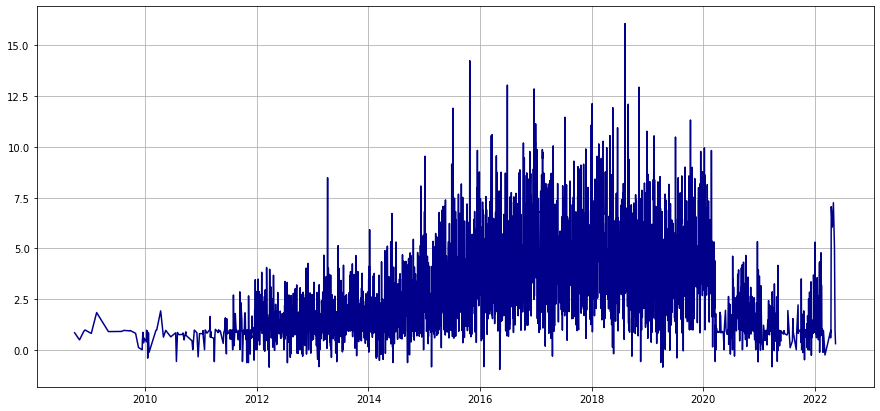

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_2_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==1] 
topic_2_sentiment = topic_2_sentiment[topic_2_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_2_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_2.csv')
df_bygroup

,scores,date
date_2,,
2009-01-01,0.9335,2009-01-01
2009-03-04,1.8846,2009-03-04
2009-04-26,0.6581,2009-04-26
2009-08-21,0.4926,2009-08-21
2009-10-12,0.9971,2009-10-12
...,...,...
2022-04-17,1.8836,2022-04-17
2022-04-24,1.6948,2022-04-24
2022-05-01,3.8011,2022-05-01


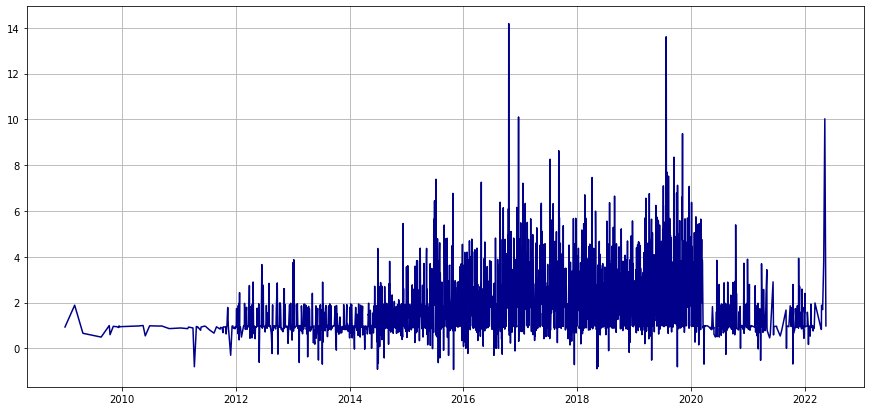

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_3_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==2] 
topic_3_sentiment = topic_3_sentiment[topic_3_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_3_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_3.csv')
df_bygroup

,scores,date
date_2,,
2008-08-26,0.9430,2008-08-26
2008-09-25,0.6249,2008-09-25
2008-10-08,0.9647,2008-10-08
2008-10-15,0.8720,2008-10-15
2009-03-04,0.9216,2009-03-04
...,...,...
2022-04-17,27.1119,2022-04-17
2022-04-24,21.0314,2022-04-24
2022-05-01,19.8389,2022-05-01


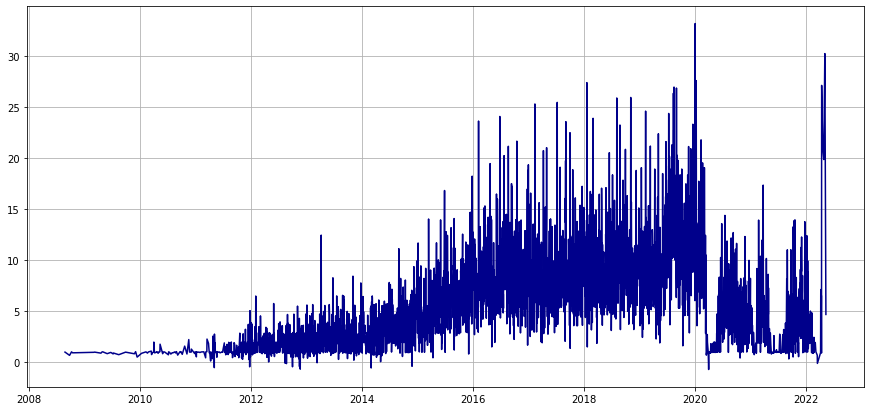

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_4_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==3] 
topic_4_sentiment = topic_4_sentiment[topic_4_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_4_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_4.csv')
df_bygroup

,scores,date
date_2,,
2008-07-12,0.7506,2008-07-12
2009-01-24,0.9769,2009-01-24
2009-03-20,0.8225,2009-03-20
2009-04-12,0.9682,2009-04-12
2009-04-21,0.9246,2009-04-21
...,...,...
2022-04-17,5.7093,2022-04-17
2022-04-24,2.8299,2022-04-24
2022-05-01,4.5313,2022-05-01


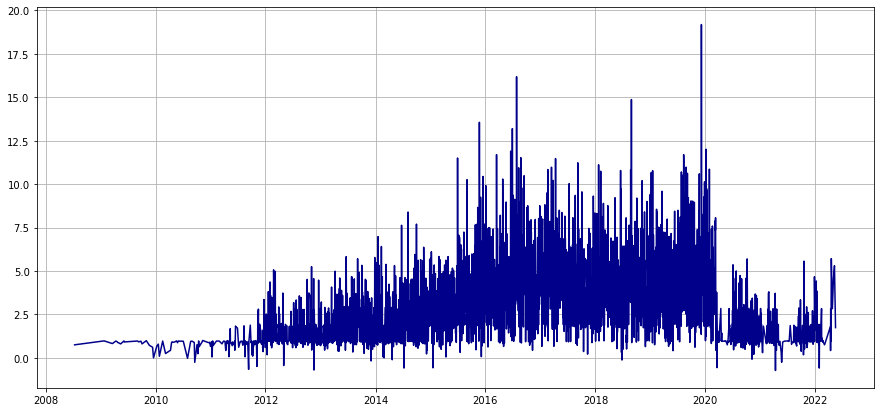

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_5_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==4] 
topic_5_sentiment = topic_5_sentiment[topic_5_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_5_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_5.csv')
df_bygroup

,scores,date
date_2,,
2009-02-07,0.5927,2009-02-07
2009-02-10,0.9786,2009-02-10
2009-08-09,0.6429,2009-08-09
2010-01-11,0.9311,2010-01-11
2010-01-20,0.9855,2010-01-20
...,...,...
2022-04-16,0.8555,2022-04-16
2022-04-17,1.8317,2022-04-17
2022-04-24,1.1671,2022-04-24


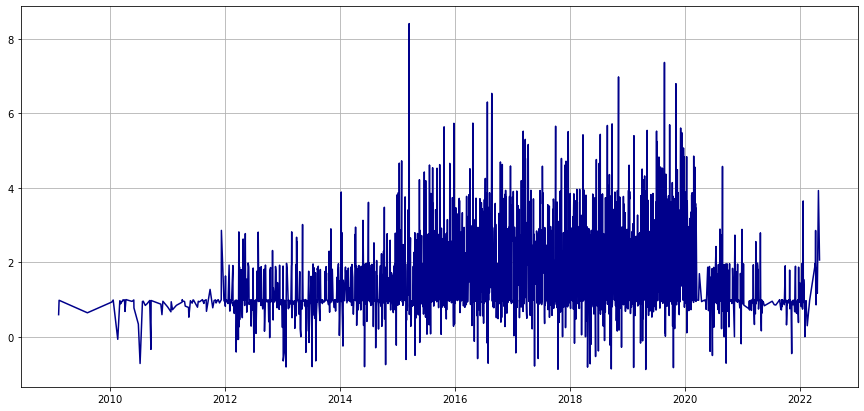

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_6_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==5] 
topic_6_sentiment = topic_6_sentiment[topic_6_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_6_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_6.csv')
df_bygroup

,scores,date
date_2,,
2008-08-27,0.7071,2008-08-27
2008-09-24,-0.5423,2008-09-24
2008-10-01,0.5988,2008-10-01
2008-10-07,1.8176,2008-10-07
2009-01-04,0.9152,2009-01-04
...,...,...
2022-04-17,7.6982,2022-04-17
2022-04-24,1.4780,2022-04-24
2022-05-01,7.7701,2022-05-01


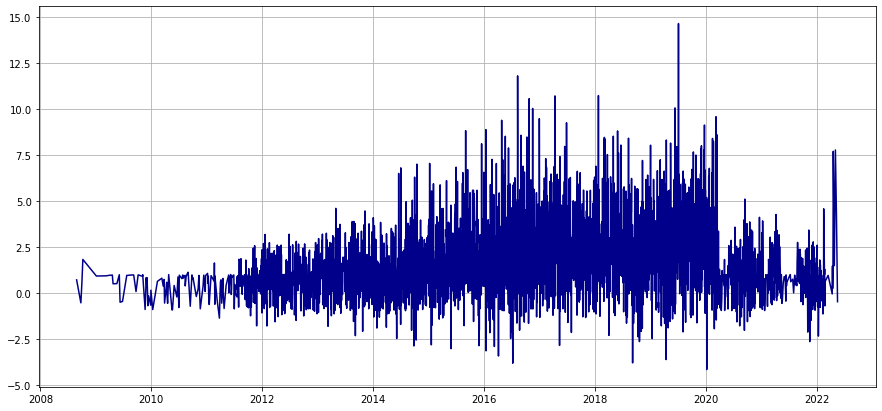

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_7_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==6] 
topic_7_sentiment = topic_7_sentiment[topic_7_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_7_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_7.csv')
df_bygroup

,scores,date
date_2,,
2009-01-22,0.9577,2009-01-22
2009-04-26,0.8440,2009-04-26
2009-05-03,0.9578,2009-05-03
2009-05-28,0.9476,2009-05-28
2009-08-05,0.9785,2009-08-05
...,...,...
2022-04-17,4.5810,2022-04-17
2022-04-24,16.0038,2022-04-24
2022-05-01,11.1488,2022-05-01


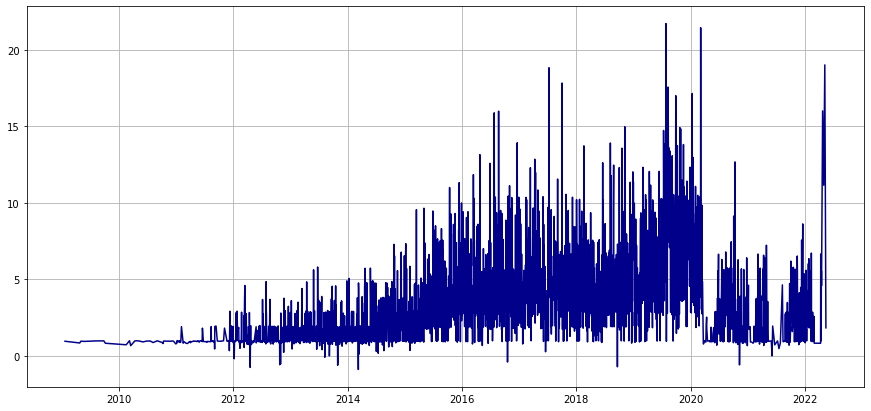

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_8_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==7] 
topic_8_sentiment = topic_8_sentiment[topic_8_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_8_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_8.csv')
df_bygroup

,scores,date
date_2,,
2008-01-02,0.8312,2008-01-02
2008-05-26,0.9793,2008-05-26
2008-08-28,0.9524,2008-08-28
2008-09-01,0.8126,2008-09-01
2008-12-25,0.9152,2008-12-25
...,...,...
2022-04-17,5.7494,2022-04-17
2022-04-24,8.3162,2022-04-24
2022-05-01,10.6686,2022-05-01


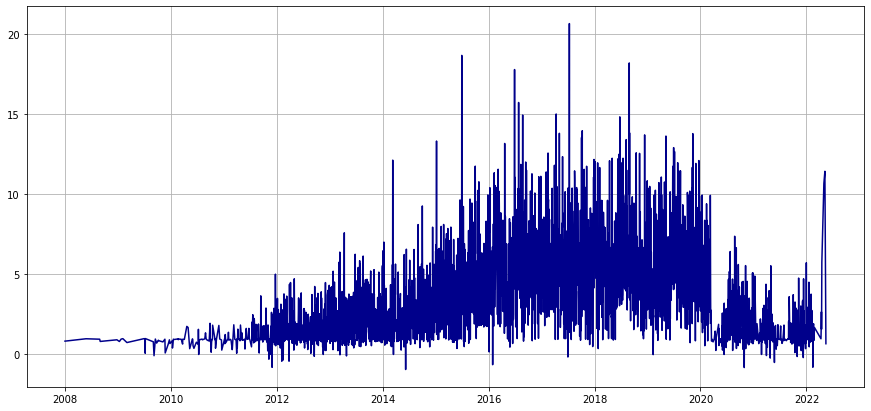

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_9_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==8] 
topic_9_sentiment = topic_9_sentiment[topic_9_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_9_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_9.csv')
df_bygroup

,scores,date
date_2,,
2008-07-12,0.9022,2008-07-12
2008-12-02,0.9017,2008-12-02
2009-01-19,0.9042,2009-01-19
2009-02-13,0.9936,2009-02-13
2009-03-09,0.9584,2009-03-09
...,...,...
2022-04-13,0.9542,2022-04-13
2022-04-17,3.1403,2022-04-17
2022-04-24,0.5361,2022-04-24


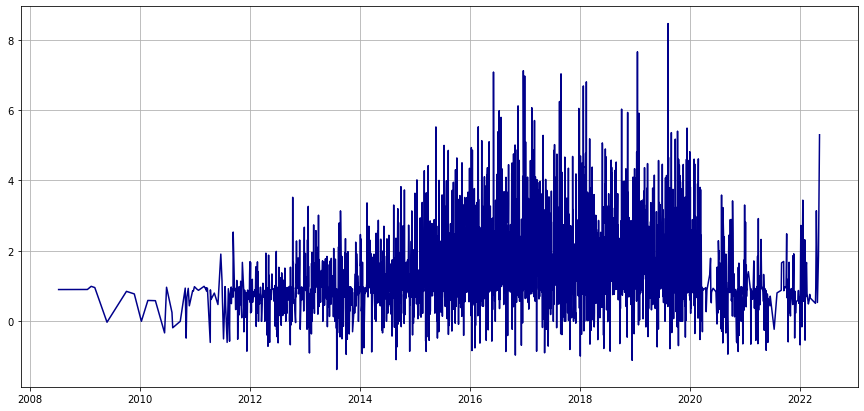

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_10_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==9] 
topic_10_sentiment = topic_10_sentiment[topic_10_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_10_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_10.csv')
df_bygroup

,scores,date
date_2,,
2009-04-30,0.9878,2009-04-30
2009-09-21,-0.3612,2009-09-21
2009-10-08,0.9628,2009-10-08
2009-10-19,0.4019,2009-10-19
2010-01-21,0.5222,2010-01-21
...,...,...
2022-02-25,0.7424,2022-02-25
2022-03-01,0.7264,2022-03-01
2022-04-24,1.8403,2022-04-24


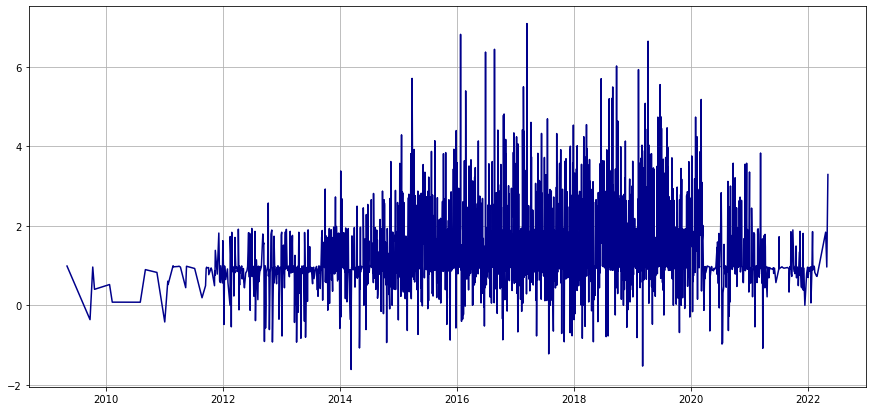

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_11_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==10] 
topic_11_sentiment = topic_11_sentiment[topic_11_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_11_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_11.csv')
df_bygroup

,scores,date
date_2,,
2008-08-30,0.9834,2008-08-30
2008-12-28,0.6514,2008-12-28
2009-02-18,-0.4715,2009-02-18
2009-03-14,0.9307,2009-03-14
2009-03-21,0.8126,2009-03-21
...,...,...
2022-04-24,3.7658,2022-04-24
2022-05-01,11.8352,2022-05-01
2022-05-08,6.5805,2022-05-08


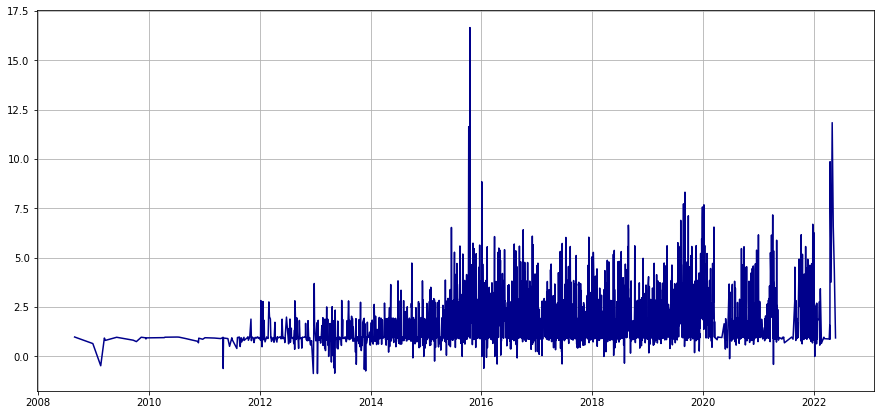

In [ ]:
plt.figure(figsize=(15,7))
plt.rcParams['agg.path.chunksize'] = 10000
plt.plot(df_bygroup['date'],df_bygroup['scores'],color="darkblue")

#plt.set_ylim([0,140000])
plt.grid()
plt.show()

In [ ]:
topic_12_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==11] 
topic_12_sentiment = topic_12_sentiment[topic_12_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_12_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_12.csv')
df_bygroup

,scores,date
date_2,,
2008-08-18,0.9360,2008-08-18
2008-08-27,0.4019,2008-08-27
2008-09-24,0.4215,2008-09-24
2008-12-25,0.5399,2008-12-25
2009-01-14,0.8225,2009-01-14
...,...,...
2022-04-16,0.9131,2022-04-16
2022-04-17,5.3987,2022-04-17
2022-04-24,1.3005,2022-04-24


In [ ]:
topic_13_sentiment = df_topics_complete[df_topics_complete['topic_dominant']==12] 
topic_13_sentiment = topic_13_sentiment[topic_13_sentiment.date_2.notnull()]
df_bygroup=pd.DataFrame(topic_13_sentiment.groupby(['date_2'])['scores'].agg('sum'))
df_bygroup['date']=df_bygroup.index
df_bygroup.to_csv('Restauracion_SA_dates_13.csv')
df_bygroup

,scores,date
date_2,,
2008-12-04,0.8922,2008-12-04
2008-12-15,0.9517,2008-12-15
2009-01-27,0.9537,2009-01-27
2009-03-09,0.8712,2009-03-09
2009-03-10,0.9968,2009-03-10
...,...,...
2022-04-17,2.8151,2022-04-17
2022-04-24,4.5832,2022-04-24
2022-05-01,1.8552,2022-05-01
